Import libraries (working update)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import scipy.stats as stats
import plotly.offline as py
import plotly.express as px
import plotly.graph_objs as go
import plotly.tools as tls
import statsmodels.api as sm
from scipy.stats import pearsonr, ttest_ind, ttest_1samp
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, mean_squared_error, r2_score
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
import folium
import folium.plugins
py.init_notebook_mode(connected=True)
plt.style.use('fivethirtyeight')
import warnings 
warnings.filterwarnings('ignore')
sns.set(style='whitegrid')

# Data cleaning process:
- Sort columns that I need for the project
- Merge terrorism database with different datasets
- Excludes possible outliers (ex., countries in active wars) and compares results

## Improting the first data set - global terrorism dataset

In [3]:
# Load with pandas dataframe
terror = pd.read_csv('data/globalterrorismdb_0718dist.csv', encoding='ISO-8859-1', dtype = "object")
# Select columns that I will use for the exploration
new_terror = terror[['iyear', 'country_txt', 'region_txt', 'latitude', 'longitude', 'attacktype1_txt', 'gname']].copy()
# Add 'year' column for same values from the 'iyear'
new_terror['year'] = pd.to_numeric(new_terror['iyear'])

In [4]:
# Drop iyear column
new_terror.drop(columns='iyear', inplace=True)
# My hypothesis test and project focus on the GWOT (Global War on Terrorism) Campaign era, which started in 2001.
new_terror_after_2000 = new_terror[new_terror['year'] >= 2001].copy()

In [5]:
# Reset the column order as easier to navigate
new_column_order = ['year', 'country_txt', 'region_txt', 'latitude', 'longitude', 'attacktype1_txt', 'gname']
new_terror_after_2000 = new_terror_after_2000.reindex(columns=new_column_order)

In [6]:
# Test the output
new_terror_after_2000.head(3)

,year,country_txt,region_txt,latitude,longitude,attacktype1_txt,gname
71650,2001,Colombia,South America,3.800889,-76.641271,Unknown,Paramilitaries
71651,2001,Yemen,Middle East & North Africa,12.825647,44.846416,Bombing/Explosion,Unknown
71652,2001,Colombia,South America,4.5981,-74.07603,Hostage Taking (Kidnapping),United Self Defense Units of Colombia (AUC)


In [7]:
# Check the data with a specific country name
burkina_terror = new_terror_after_2000[(new_terror_after_2000['country_txt'] == 'Burkina Faso')]
burkina_terror.head(3)

,year,country_txt,region_txt,latitude,longitude,attacktype1_txt,gname
120786,2013,Burkina Faso,Sub-Saharan Africa,12.347598,-1.538065,Assassination,Unknown
146400,2015,Burkina Faso,Sub-Saharan Africa,14.781106,0.013595,Hostage Taking (Kidnapping),Al-Mua'qi'oon Biddam Brigade (Those who Sign w...
152207,2015,Burkina Faso,Sub-Saharan Africa,14.678733,-0.462031,Armed Assault,Boko Haram


### Create a first offset dataset for mapping purposes

In [8]:
# Remove 'NaN' values from 'latitude', and 'longitude'
for_map = new_terror_after_2000.dropna(subset=['latitude', 'longitude'])

In [9]:
# Check the data
for_map.head(3)

,year,country_txt,region_txt,latitude,longitude,attacktype1_txt,gname
71650,2001,Colombia,South America,3.800889,-76.641271,Unknown,Paramilitaries
71651,2001,Yemen,Middle East & North Africa,12.825647,44.846416,Bombing/Explosion,Unknown
71652,2001,Colombia,South America,4.5981,-74.07603,Hostage Taking (Kidnapping),United Self Defense Units of Colombia (AUC)


#### Map overview of terrorism incidents from 2001 to 2017 by regions

In [10]:
# There are 12 regions in this dataset. Give unique colors for each regions.
color_scale = {
    'South America': 'blue',
    'Middle East & North Africa': 'red',
    'Eastern Europe': 'green',
    'North America': 'orange',
    'Western Europe': 'purple',
    'South Asia': 'yellow',
    'Sub-Saharan Africa': 'pink',
    'Southeast Asia': 'brown',
    'Central America & Caribbean': 'cyan',
    'East Asia': 'magenta',
    'Central Asia': 'gray',
    'Australasia & Oceania': 'black'
}

for_map['color'] = for_map['region_txt'].map(color_scale)

fig = go.Figure(go.Scattermapbox(
    lat=for_map['latitude'],
    lon=for_map['longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=6,
        color=for_map['color'],  
        opacity=0.7
    ),
    text=for_map['country_txt']
))

fig.update_layout(
    mapbox=dict(
        style='carto-positron',
        center=dict(lat=0, lon=0),
        zoom=1.7
    ),
    margin=dict(l=0, r=0, t=0, b=0),
    title='Terrorist Incidents After 2000',
    height=800, width=1400
)

fig.show()

#### Created a heatmap by regions

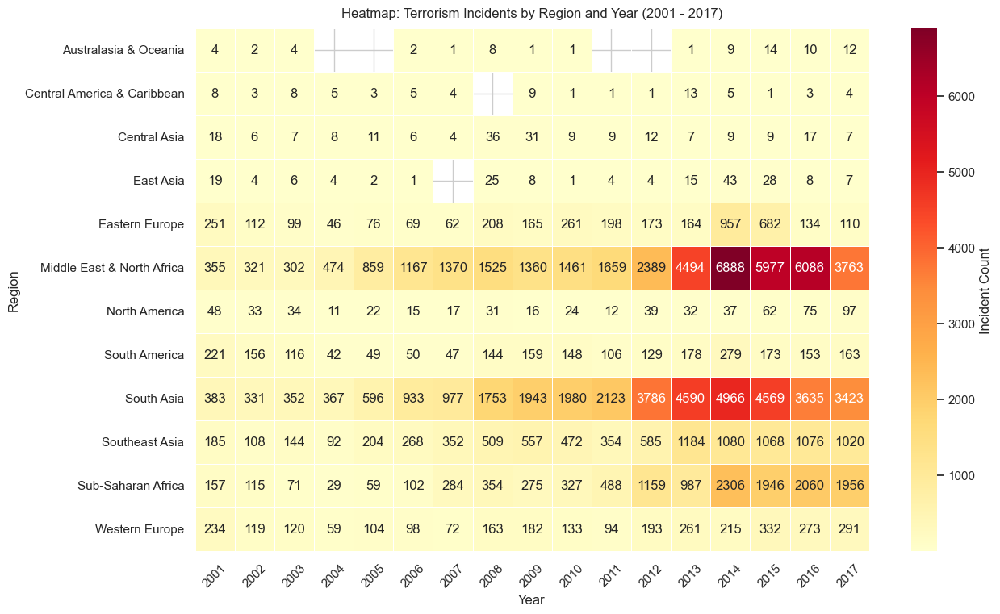

In [11]:
# Sort by years and regions of terrorism incidents
heatmap_data = new_terror_after_2000.pivot_table(index='region_txt', columns='year', values='latitude', aggfunc='count')

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', annot=True, fmt='g', linewidths=0.5, cbar_kws={'label': 'Incident Count'})
plt.xlabel('Year')
plt.ylabel('Region')
plt.xticks(rotation=45, ha='center')
plt.title('Heatmap: Terrorism Incidents by Region and Year (2001 - 2017)', pad=10)
plt.show()

# Continue for the data cleaning process

In [12]:
# Count the number of incidents by country and year and add a new column, 'incident_count'
incidents_year_and_country = new_terror_after_2000.groupby(['year', 'country_txt', 'region_txt']).size().reset_index(name='incident_count')

In [13]:
# In 2001, Afghanistan recored 14 terrorism incidents
incidents_year_and_country.head(3)

,year,country_txt,region_txt,incident_count
0,2001,Afghanistan,South Asia,14
1,2001,Albania,Eastern Europe,1
2,2001,Algeria,Middle East & North Africa,113


In [122]:
average_incidents_year_and_country = incidents_year_and_country['incident_count'].median()
average_incidents_year_and_country

5.0

Count the overall number of incidents by country names

In [15]:
# The difference between the above code and this code is the total 'sum' of the incident count
total_incidents_by_country = incidents_year_and_country.groupby(['country_txt', 'region_txt'])['incident_count'].sum().reset_index(name='total_incidents')
total_incidents_by_country = total_incidents_by_country.sort_values(by='total_incidents', ascending=False)

In [16]:
incidents_year_and_country.head(3)

,year,country_txt,region_txt,incident_count
0,2001,Afghanistan,South Asia,14
1,2001,Albania,Eastern Europe,1
2,2001,Algeria,Middle East & North Africa,113


In [17]:
by_year = incidents_year_and_country.groupby('year')['incident_count'].sum().reset_index(name='sum')

In [18]:
by_year = by_year.sort_values(by='year', ascending=False)


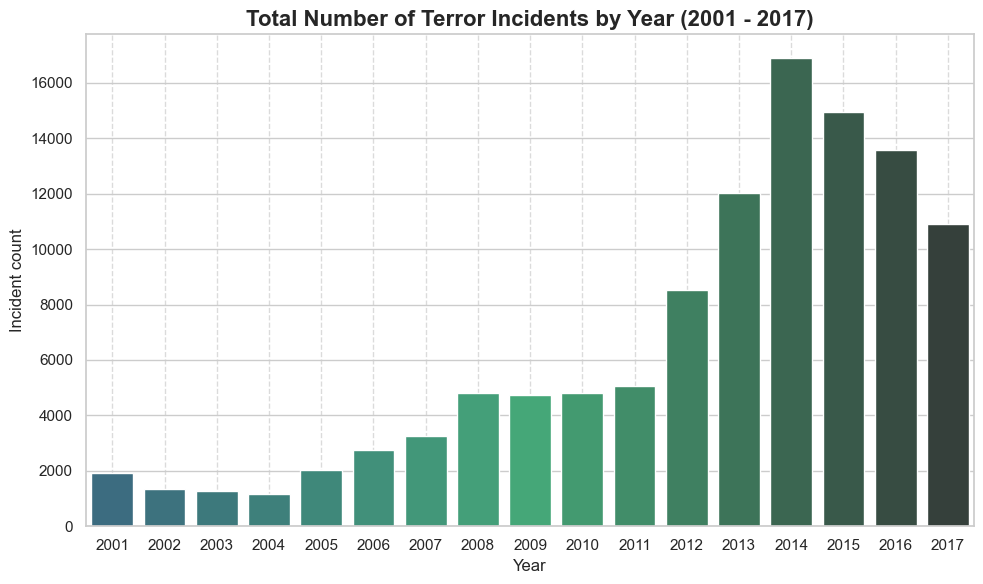

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the 'year' column as a float in your DataFrame
by_year['year'] = by_year['year'].astype(int)

# Sort the DataFrame by 'year' in descending order
by_year = by_year.sort_values(by='year', ascending=False)

# Now you can create the horizontal bar chart with a fancy gradient using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='year', y='sum', data=by_year, palette='viridis_d')
plt.xlabel('Year')
plt.ylabel('Incident count')
plt.title('Total Number of Terror Incidents by Year (2001 - 2017)', fontsize = 16, fontweight='bold')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


#### Find the average number of terrorism incidents by country

In [20]:
average_incidents_by_country = total_incidents_by_country['total_incidents'].mean().round()
max_incidents_by_country = total_incidents_by_country['total_incidents'].max()
min_incidents_by_country = total_incidents_by_country['total_incidents'].min()
print(f"Average number of terrorism incidents from 2001 to 2017 by country:", average_incidents_by_country)
print(f"Maximum number of terrorism incidents from 2001 to 2017 by country:", max_incidents_by_country)
print(f"Minium number of terrorism incidents from 2001 to 2017 by country:", min_incidents_by_country)


Average number of terrorism incidents from 2001 to 2017 by country: 671.0
Maximum number of terrorism incidents from 2001 to 2017 by country: 24465
Minium number of terrorism incidents from 2001 to 2017 by country: 1


## Recommendation for logistic regression set up : Per capita data

In [21]:
median_incident = total_incidents_by_country['total_incidents'].median()
median_incident

23.0

#### Create a pie chart with top 10 countries by incident numbers

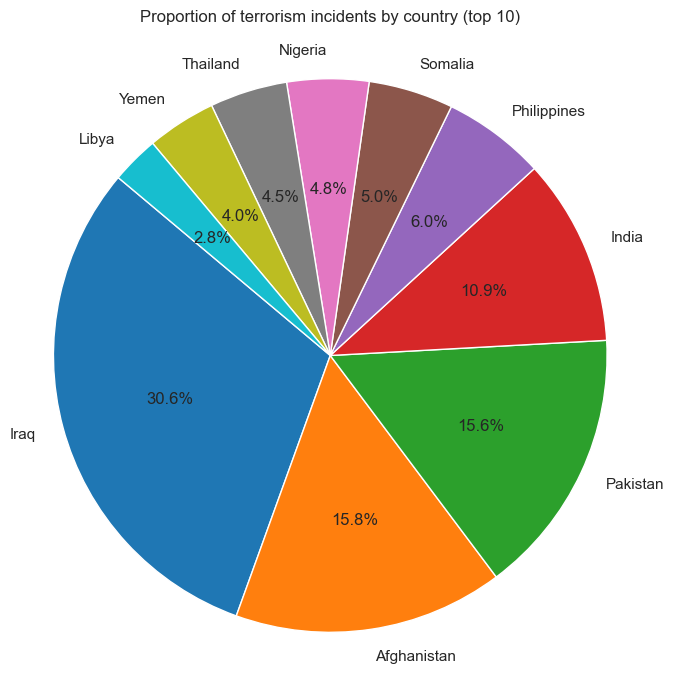

In [22]:
custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

top_countries = total_incidents_by_country.nlargest(10, 'total_incidents')
plt.figure(figsize=(7, 7))
plt.pie(top_countries['total_incidents'], labels=top_countries['country_txt'], autopct='%1.1f%%', startangle=140, colors=custom_colors)
plt.title('Proportion of terrorism incidents by country (top 10)')
plt.axis('equal')
plt.subplots_adjust(top=1)
plt.show()


### The second offset data preparation: Exclusion of countries with active wars

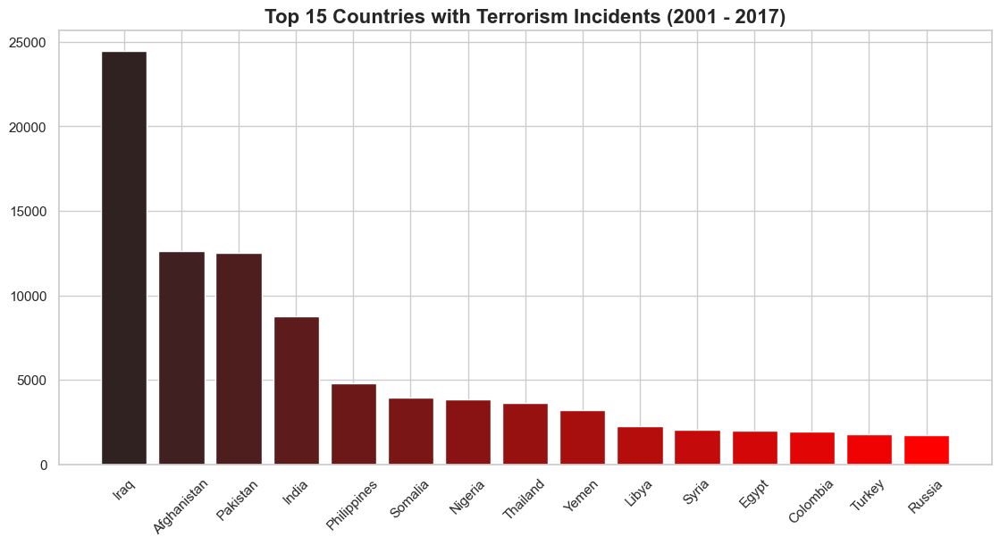

In [23]:
# Create a color palette
n_colors = 15
gradient_palette = sns.dark_palette("red", n_colors=n_colors)

# Plot the bar chart with the custom color palette
plt.figure(figsize=(12, 6))
plt.bar(total_incidents_by_country['country_txt'].head(15), total_incidents_by_country['total_incidents'].head(15), color=gradient_palette)
plt.xticks(rotation=45, ha='center')
plt.title("Top 15 Countries with Terrorism Incidents (2001 - 2017)", fontsize=16, fontweight='bold')
plt.show()


Bar graph is better for visualization

Dilemma
- As depicted in the chart, the differences between the highest incidents group and others have highly different numbers. 
- Countries with active ongoing wars, such as Iraq, inevitably have higher terrorism incidents than others.
- Therefore, here's the dilemma. Do I need to remove countries with active wars or stick with the original list?

#### New variable excluding countries of active wars

In [24]:
# List of countries with active conflicts since 2001 under Global War on Terrorism Campaign
countries_with_wars = ['Afghanistan', 'Pakistan', 'Iraq', 'Somalia', 'Yemen', 'Syria']
# Exclude rows with countries in the dataset
filter_countries = ~new_terror_after_2000['country_txt'].isin(countries_with_wars)
# Create a new variable without those countries
filtered_terror_countries = new_terror_after_2000[filter_countries]
without_countries_with_war = filtered_terror_countries.groupby(['year', 'country_txt', 'region_txt']).size().reset_index(name='incident_count')
filtered_sum_by_country = without_countries_with_war.groupby(['country_txt', 'region_txt'])['incident_count'].sum().reset_index(name='total_incidents')

This variable shows the new dataset without countries designated with GWOT

In [25]:
filtered_sum_by_country = filtered_sum_by_country.sort_values(by='total_incidents', ascending=False)

In [26]:
filtered_sum_by_country.head(3)

,country_txt,region_txt,total_incidents
63,India,South Asia,8738
111,Philippines,Southeast Asia,4788
105,Nigeria,Sub-Saharan Africa,3820


The pie chart without countries without active wars

Different version of bar graph

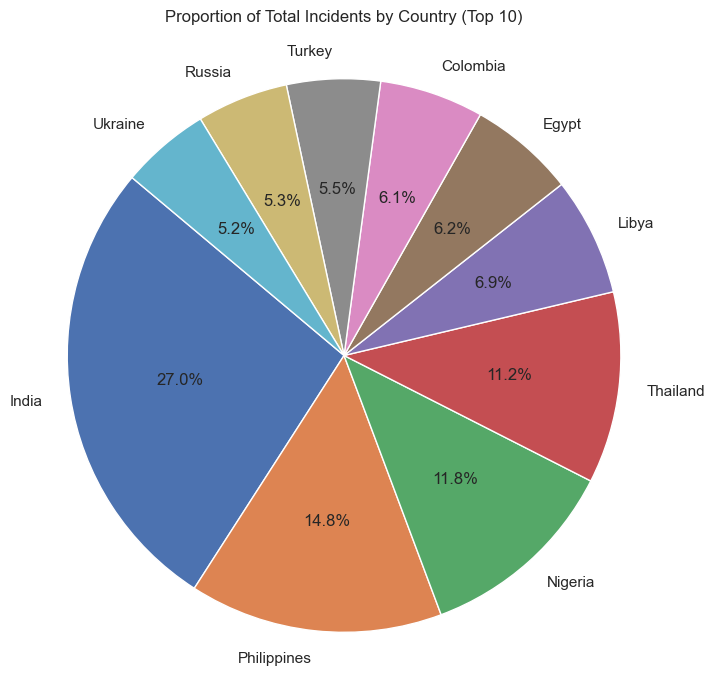

In [27]:
top_countries_filtered = filtered_sum_by_country.nlargest(10, 'total_incidents')
plt.figure(figsize=(7, 7))
plt.pie(top_countries_filtered['total_incidents'], labels=top_countries_filtered['country_txt'], autopct='%1.1f%%', startangle=140)
plt.title('Proportion of Total Incidents by Country (Top 10)')
plt.axis('equal')
plt.subplots_adjust(top=1)
plt.show()

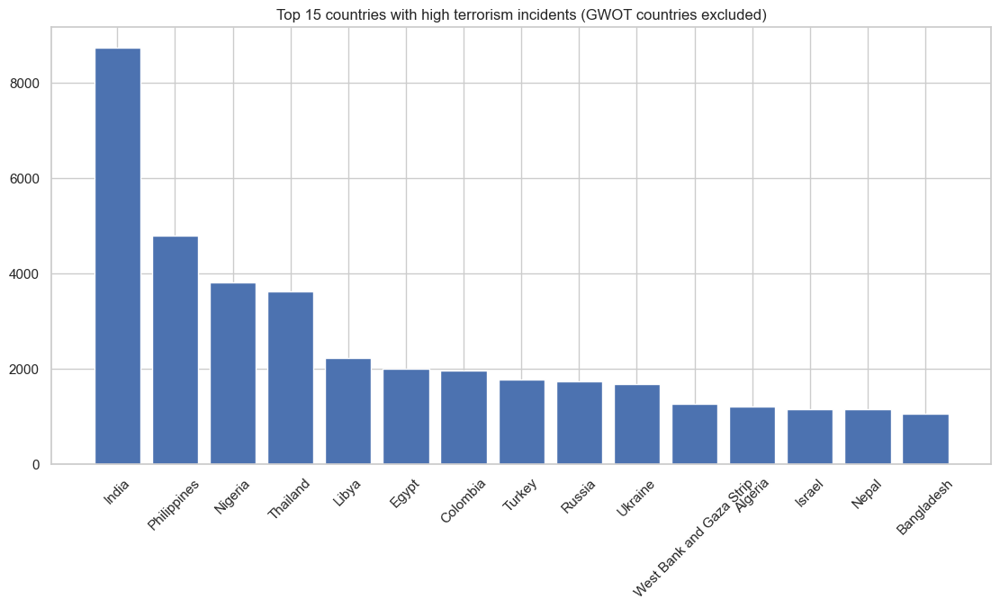

In [28]:
plt.figure(figsize=(12,6))
plt.bar(filtered_sum_by_country['country_txt'].head(15), filtered_sum_by_country['total_incidents'].head(15))
plt.title('Top 15 countries with high terrorism incidents (GWOT countries excluded)')
plt.xticks(rotation=45, ha='center')
plt.show()

Check the mean difference to the original dataset

In [29]:
print(without_countries_with_war['incident_count'].mean())
print(filtered_sum_by_country['total_incidents'].mean())

38.289985052316894
324.253164556962


## Load the second dataset: GDP per capita

In [30]:
gdp_capita = pd.read_csv('data/per_capita.csv')
gdp_capita.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62219 entries, 0 to 62218
Data columns (total 8 columns):
 #   Column                                                                              Non-Null Count  Dtype  
---  ------                                                                              --------------  -----  
 0   Entity                                                                              62219 non-null  object 
 1   Code                                                                                58638 non-null  object 
 2   Year                                                                                62219 non-null  int64  
 3   Average harmonised learning outcome score (Altinok, Angrist, and Patrinos (2018))   627 non-null    float64
 4   GDP per capita                                                                      19876 non-null  float64
 5   417485-annotations                                                                  21 non-null 

In [31]:
# Filter 'Year' from 2001 to 2017 to merge with global terrorism dataset
gdp_filtered = gdp_capita[(gdp_capita['Year'] >= 2001) & (gdp_capita['Year'] <= 2017)]
gdp_filtered.drop(gdp_filtered.columns[[1, 3, 5, 7]], axis=1, inplace=True)
gdp = gdp_filtered.dropna()

In [32]:
gdp_filtered.isnull().sum()

Entity                                  0
Year                                    0
GDP per capita                       1625
Population (historical estimates)     172
dtype: int64

In [33]:
gdp.tail(3)

,Entity,Year,GDP per capita,Population (historical estimates)
62025,Zimbabwe,2015,1560.0000,14154937.0
62026,Zimbabwe,2016,1534.0000,14452705.0
62027,Zimbabwe,2017,1582.3662,14751101.0


In [34]:
syria_gdp = gdp[(gdp['Entity'] == 'Syria')]
syria_gdp.head()

,Entity,Year,GDP per capita,Population (historical estimates)
53709,Syria,2005,7037.7183,18583556.0
53710,Syria,2010,6520.6123,22337558.0
53765,Syria,2001,7509.3040,16727949.0
53766,Syria,2002,7529.7017,17164026.0
53767,Syria,2003,6986.5240,17611356.0


## Merge GDP data and the globlar terrorism data

In [35]:
incident_gdp = pd.merge(incidents_year_and_country, gdp, left_on=['country_txt', 'year'], right_on=['Entity', 'Year'])
incident_gdp.drop(columns=['Entity', 'Year'], inplace=True)


In [36]:
# Check the result
incident_gdp.head(3)

,year,country_txt,region_txt,incident_count,GDP per capita,Population (historical estimates)
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0


In [37]:
incident_gdp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1241 entries, 0 to 1240
Data columns (total 6 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   year                               1241 non-null   int64  
 1   country_txt                        1241 non-null   object 
 2   region_txt                         1241 non-null   object 
 3   incident_count                     1241 non-null   int64  
 4   GDP per capita                     1241 non-null   float64
 5   Population (historical estimates)  1241 non-null   float64
dtypes: float64(2), int64(2), object(2)
memory usage: 67.9+ KB


In [38]:
# Simplify the name of population column
incident_gdp.rename(columns={'Population (historical estimates)': 'population'}, inplace=True)

In [39]:
# Add a new column called 'incident_per_capita (incident count / population)
incident_gdp['incident_per_capita'] = incident_gdp['incident_count'] / incident_gdp['population']

In [40]:
incident_gdp.head(3)

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0,7.110702e-07
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0,3.170964e-07
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0,3.621681e-06


Find correlation between incident count and incident per capita

What is the incident per capita? it indicates the average or per person occurrence of incidents in that specific location, which provides a standardized incident rate.

In [41]:
sorted_capita = incident_gdp.sort_values(by='incident_per_capita', ascending=False)

top_20_countries = sorted_capita.head(10)

top_20_countries


,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita
924,2014,Libya,Middle East & North Africa,728,9736.000,6097767.0,0.000119
913,2014,Iraq,Middle East & North Africa,3933,12817.000,36746484.0,0.000107
1014,2015,Libya,Middle East & North Africa,543,8514.000,6192241.0,0.000088
1095,2016,Iraq,Middle East & North Africa,3360,13898.000,38697940.0,0.000087
832,2013,Iraq,Middle East & North Africa,2852,13158.000,35481804.0,0.000080
1002,2015,Iraq,Middle East & North Africa,2751,13014.000,37757812.0,0.000073
1107,2016,Libya,Middle East & North Africa,422,8096.000,6282202.0,0.000067
1186,2017,Iraq,Middle East & North Africa,2466,13211.263,39621156.0,0.000062
966,2015,Afghanistan,South Asia,1928,1928.000,33753500.0,0.000057
878,2014,Afghanistan,South Asia,1824,2022.000,32716214.0,0.000056


In [42]:
per_capita_corr = incident_gdp[['incident_count', 'incident_per_capita']].corr()
print(per_capita_corr)

                     incident_count  incident_per_capita
incident_count             1.000000             0.752252
incident_per_capita        0.752252             1.000000


In [43]:
pop_capita_corr = incident_gdp[['incident_count', 'population']].corr()
print(pop_capita_corr)

                incident_count  population
incident_count        1.000000    0.140462
population            0.140462    1.000000


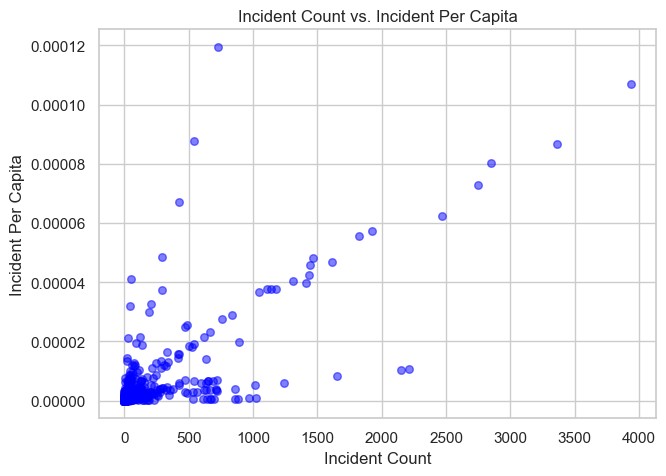

In [44]:
# Scatter plot shows visual relationship between incident count and incident per capita
plt.scatter(incident_gdp['incident_count'], incident_gdp['incident_per_capita'], c='blue', s=30, alpha=0.5)
plt.xlabel('Incident Count')
plt.ylabel('Incident Per Capita')
plt.title('Incident Count vs. Incident Per Capita')
plt.show()

Finding relationship between multiple features and target (incident_count)

In [45]:
correlation_pop = incident_gdp[['GDP per capita', 'incident_count', 'incident_per_capita', 'population']].corr()
correlation_pop

,GDP per capita,incident_count,incident_per_capita,population
GDP per capita,1.000000,-0.118927,-0.062262,-0.072010
incident_count,-0.118927,1.000000,0.752252,0.140462
incident_per_capita,-0.062262,0.752252,1.000000,-0.059011
population,-0.072010,0.140462,-0.059011,1.000000


Top 15 countries with incident per capita

In [46]:
grouped_by_country = incident_gdp.groupby('country_txt')['incident_per_capita'].mean()
top_15_countries = grouped_by_country.sort_values(ascending=False).head(15)
print(top_15_countries)

country_txt
Iraq                        0.000042
Libya                       0.000040
Afghanistan                 0.000024
Bahrain                     0.000012
Syria                       0.000010
Israel                      0.000009
Yemen                       0.000007
Lebanon                     0.000006
Central African Republic    0.000004
Pakistan                    0.000004
Malta                       0.000004
Namibia                     0.000003
Thailand                    0.000003
Iceland                     0.000003
Ukraine                     0.000003
Name: incident_per_capita, dtype: float64


In [47]:
quantile_25_incident = incident_gdp.groupby('country_txt')['incident_per_capita'].quantile(0.25)
quantile_25_incident = grouped_by_country.sort_values(ascending=False).tail(15)
quantile_25_incident

country_txt
United States    8.387320e-08
Madagascar       8.038934e-08
Malawi           7.039099e-08
Ethiopia         6.647480e-08
Mexico           6.322741e-08
Taiwan           6.202668e-08
Romania          4.854954e-08
Argentina        4.848417e-08
Vietnam          3.569164e-08
Ghana            3.465080e-08
Poland           3.240745e-08
Japan            2.441660e-08
South Korea      2.043873e-08
Brazil           1.219843e-08
China            6.530364e-09
Name: incident_per_capita, dtype: float64

Now, create a 'plan B' variable, which is merging GDP dataset with incidents data without countries with active wars

In [48]:
without_countries_with_war.head(3)

,year,country_txt,region_txt,incident_count
0,2001,Albania,Eastern Europe,1
1,2001,Algeria,Middle East & North Africa,113
2,2001,Angola,Sub-Saharan Africa,40


In [49]:
without_countries_with_war.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   year            1338 non-null   int64 
 1   country_txt     1338 non-null   object
 2   region_txt      1338 non-null   object
 3   incident_count  1338 non-null   int64 
dtypes: int64(2), object(2)
memory usage: 41.9+ KB


In [50]:
exclude_incident_gdp = pd.merge(gdp, without_countries_with_war, left_on=['Year', 'Entity'], right_on=['year', 'country_txt']) 

In [51]:
# Check data
exclude_incident_gdp.head(2)

,Entity,Year,GDP per capita,Population (historical estimates),year,country_txt,region_txt,incident_count
0,Albania,2015,10032.000,2882482.0,2015,Albania,Eastern Europe,4
1,Albania,2001,5285.809,3153615.0,2001,Albania,Eastern Europe,1


In [52]:
# Rename the population column
exclude_incident_gdp.rename(columns={'Population (historical estimates)': 'population'}, inplace=True)

In [53]:
# Add new column 'incident_per_capita'
exclude_incident_gdp['incident_per_capita'] = exclude_incident_gdp['incident_count'] / exclude_incident_gdp['population']

In [54]:
# Check the dataset
burkina_gdp = exclude_incident_gdp[(exclude_incident_gdp['Entity'] == 'Burkina Faso')]
burkina_gdp

,Entity,Year,GDP per capita,population,year,country_txt,region_txt,incident_count,incident_per_capita
142,Burkina Faso,2013,1422.0000,17636414.0,2013,Burkina Faso,Sub-Saharan Africa,1,5.670087e-08
143,Burkina Faso,2015,1450.0000,18718022.0,2015,Burkina Faso,Sub-Saharan Africa,6,3.205467e-07
144,Burkina Faso,2016,1483.0000,19275504.0,2016,Burkina Faso,Sub-Saharan Africa,10,5.187932e-07
145,Burkina Faso,2017,1530.2047,19835860.0,2017,Burkina Faso,Sub-Saharan Africa,32,1.613240e-06


In [55]:
excluded_grouped_by_country = exclude_incident_gdp.groupby('country_txt')['incident_per_capita'].mean()
excluded_top_15_countries = excluded_grouped_by_country.sort_values(ascending=False).head(15)
print(excluded_top_15_countries)

country_txt
Libya                       0.000040
Bahrain                     0.000012
Israel                      0.000009
Lebanon                     0.000006
Central African Republic    0.000004
Malta                       0.000004
Namibia                     0.000003
Thailand                    0.000003
Iceland                     0.000003
Ukraine                     0.000003
Philippines                 0.000003
Greece                      0.000003
Ireland                     0.000003
Colombia                    0.000003
Nepal                       0.000003
Name: incident_per_capita, dtype: float64


In [56]:
excluded_filtered_incident_per_capit_desc = exclude_incident_gdp.sort_values(by='incident_per_capita', ascending=False)

In [57]:
excluded_filtered_incident_per_capit_desc

,Entity,Year,GDP per capita,population,year,country_txt,region_txt,incident_count,incident_per_capita
646,Libya,2014,9736.0000,6.097767e+06,2014,Libya,Middle East & North Africa,728,1.193880e-04
647,Libya,2015,8514.0000,6.192241e+06,2015,Libya,Middle East & North Africa,543,8.769039e-05
648,Libya,2016,8096.0000,6.282202e+06,2016,Libya,Middle East & North Africa,422,6.717390e-05
645,Libya,2013,13326.0000,5.985228e+06,2013,Libya,Middle East & North Africa,291,4.861970e-05
82,Bahrain,2013,38493.0000,1.261683e+06,2013,Bahrain,Middle East & North Africa,52,4.121479e-05
...,...,...,...,...,...,...,...,...,...
230,China,2003,5649.4634,1.288873e+09,2003,China,East Asia,3,2.327614e-09
229,China,2002,5343.1123,1.280926e+09,2002,China,East Asia,2,1.561370e-09
231,China,2004,6067.5913,1.296817e+09,2004,China,East Asia,2,1.542238e-09
232,China,2005,6626.5920,1.304888e+09,2005,China,East Asia,1,7.663496e-10


In [58]:
sorted_correlation = exclude_incident_gdp[['GDP per capita', 'incident_count', 'incident_per_capita', 'population']].corr()
sorted_correlation

,GDP per capita,incident_count,incident_per_capita,population
GDP per capita,1.000000,-0.111532,-0.002745,-0.076487
incident_count,-0.111532,1.000000,0.372281,0.376274
incident_per_capita,-0.002745,0.372281,1.000000,-0.059255
population,-0.076487,0.376274,-0.059255,1.000000


Comparisons between filtered vs. non-filtered dataset

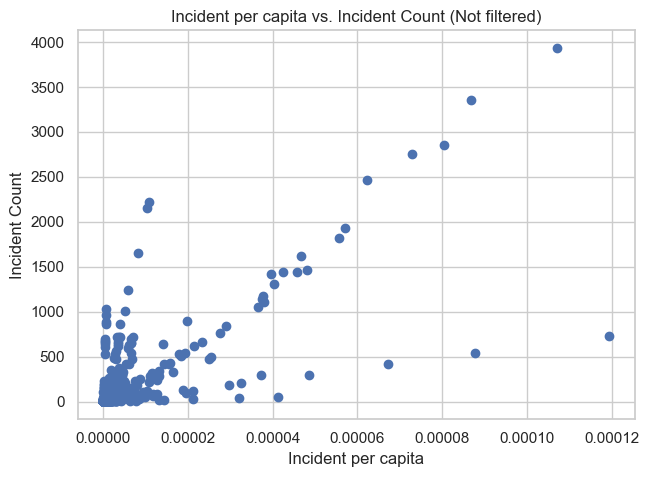

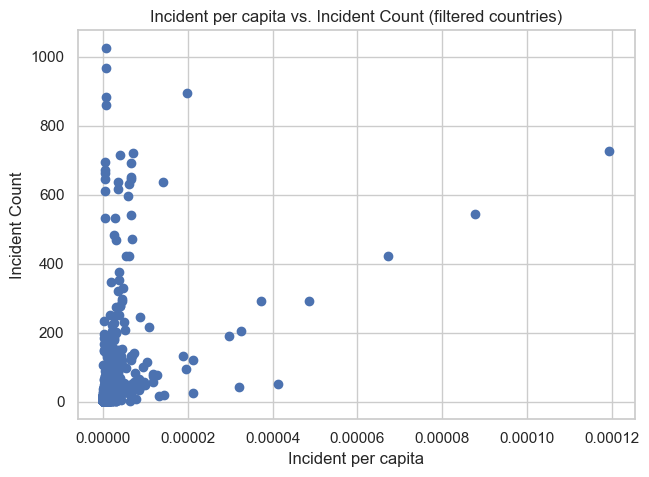

In [59]:
# Not filtered data
plt.scatter(incident_gdp['incident_per_capita'], incident_gdp['incident_count'])
plt.xlabel('Incident per capita')
plt.ylabel('Incident Count')
plt.title('Incident per capita vs. Incident Count (Not filtered)')
plt.show()

# Filtered data
plt.scatter(exclude_incident_gdp['incident_per_capita'], exclude_incident_gdp['incident_count'])
plt.xlabel('Incident per capita')
plt.ylabel('Incident Count')
plt.title('Incident per capita vs. Incident Count (filtered countries)')
plt.show()


## Load the third dataset: Education level

In [60]:
education = pd.read_csv('data/mean-years-of-schooling-long-run.csv')
# Again, I only need data from 2001 to 2017.
education_after_2000 = education[(education['Year'] >= 2001) & (education['Year'] <= 2017)]
# One of the column has an extremely long title, so I'm replacing it with a shorter version.
education_after_2000.rename(columns={
    'Average Total Years of Schooling for Adult Population (Lee-Lee (2016), Barro-Lee (2018) and UNDP (2018))': 'education_level'
}, inplace=True)
# I don't need the country code for this project.
education_after_2000 = education_after_2000.drop(columns='Code')

In [61]:
education_after_2000.head(3)

,Entity,Year,education_level
35,Afghanistan,2001,2.2
36,Afghanistan,2002,2.3
37,Afghanistan,2003,2.4


### Merge with incident_gdp

In [62]:
incident_gdp_edu = pd.merge(incident_gdp, education_after_2000, left_on=['year', 'country_txt'], right_on=['Year', 'Entity'], how='left')

In [63]:
incident_gdp_edu.tail(3)

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,Entity,Year,education_level
1238,2017,Yemen,Middle East & North Africa,226,2321.9238,30034386.0,7.524709e-06,Yemen,2017.0,3.0
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,Zambia,2017.0,7.0
1240,2017,Zimbabwe,Sub-Saharan Africa,3,1582.3662,14751101.0,2.033746e-07,Zimbabwe,2017.0,8.2


In [64]:
incident_gdp_edu.isnull().sum()

year                    0
country_txt             0
region_txt              0
incident_count          0
GDP per capita          0
population              0
incident_per_capita     0
Entity                 17
Year                   17
education_level        17
dtype: int64

### Identified missing values from the dataset

In [65]:
rows_with_null = incident_gdp_edu.isnull().any(axis=1)
countries_with_null = incident_gdp_edu[rows_with_null]['country_txt']
countries_with_null

28      Guinea-Bissau
46            Lebanon
50         Montenegro
56            Nigeria
71             Taiwan
116           Lebanon
123           Nigeria
137      Turkmenistan
167     Guinea-Bissau
181           Lebanon
233           Lebanon
248            Taiwan
503            Taiwan
865            Taiwan
951            Taiwan
1137           Taiwan
1226           Taiwan
Name: country_txt, dtype: object

#### Replace the missing values with the mean value of education level

In [66]:
average_education_level = incident_gdp_edu['education_level'].mean()
incident_gdp_edu['education_level'].fillna(average_education_level, inplace=True)

In [67]:
incident_gdp_edu = incident_gdp_edu.drop(columns=['Entity', 'Year'])

In [68]:
incident_gdp_edu

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,education_level
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0,7.110702e-07,2.2
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0,3.170964e-07,8.7
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0,3.621681e-06,6.1
3,2001,Angola,Sub-Saharan Africa,40,2162.4850,16941584.0,2.361054e-06,4.4
4,2001,Argentina,South America,2,13651.9810,37480492.0,5.336109e-08,9.1
...,...,...,...,...,...,...,...,...
1236,2017,Venezuela,South America,17,12879.1350,30563430.0,5.562203e-07,10.3
1237,2017,Vietnam,Southeast Asia,2,6422.0864,94033048.0,2.126912e-08,8.2
1238,2017,Yemen,Middle East & North Africa,226,2321.9238,30034386.0,7.524709e-06,3.0
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,7.0


# Define the final data set as final_data

In [69]:
final_data = incident_gdp_edu

In [70]:
final_data

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,education_level
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0,7.110702e-07,2.2
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0,3.170964e-07,8.7
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0,3.621681e-06,6.1
3,2001,Angola,Sub-Saharan Africa,40,2162.4850,16941584.0,2.361054e-06,4.4
4,2001,Argentina,South America,2,13651.9810,37480492.0,5.336109e-08,9.1
...,...,...,...,...,...,...,...,...
1236,2017,Venezuela,South America,17,12879.1350,30563430.0,5.562203e-07,10.3
1237,2017,Vietnam,Southeast Asia,2,6422.0864,94033048.0,2.126912e-08,8.2
1238,2017,Yemen,Middle East & North Africa,226,2321.9238,30034386.0,7.524709e-06,3.0
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,7.0


With final data, we can see a week relationship between education level and incidents by country

In [71]:
edu_incident_corr = final_data[['education_level', 'incident_count']].corr()
print(edu_incident_corr)

                 education_level  incident_count
education_level         1.000000       -0.137441
incident_count         -0.137441        1.000000


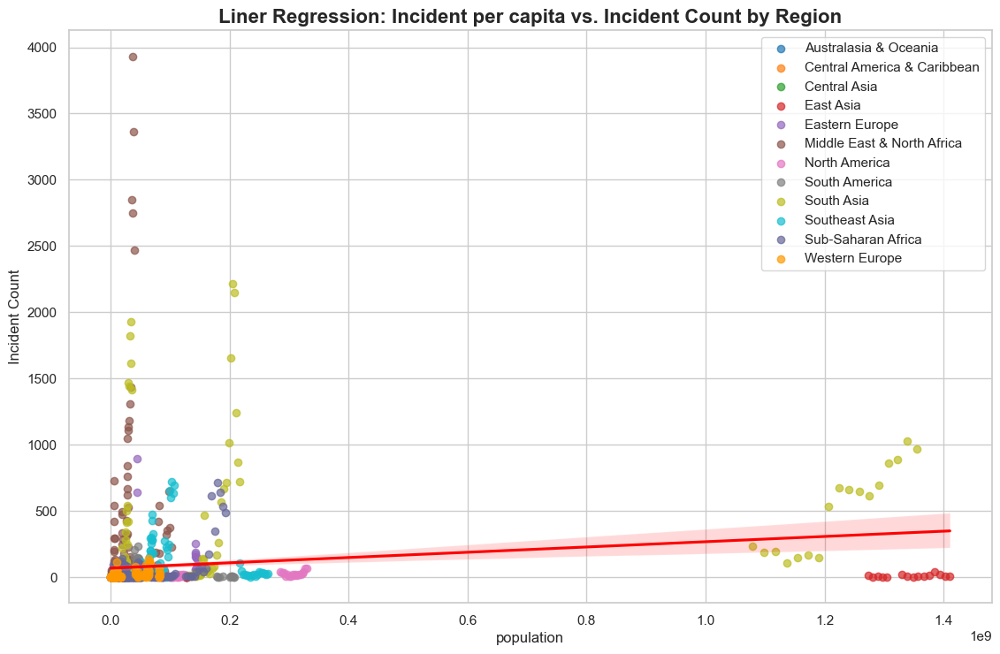

In [72]:
# Linear regression "INCIDENT PER CAPITA" and "INCIDENT COUNT"

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
                 '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
                 '#666699', '#ff9900']

selected_data = final_data.groupby('region_txt')

# Scatter plot by regions
plt.figure(figsize=(12, 8))
for i, (region, group) in enumerate(selected_data):
    incident_per_capita = group['population']
    incident_count = group['incident_count']
    plt.scatter(incident_per_capita, incident_count, alpha=0.7, label=region, color=colors[i])

# Regression line
sns.regplot(x=final_data['population'], y=final_data['incident_count'], scatter=False, color='red')

plt.xlabel('population')
plt.ylabel('Incident Count')
plt.title('Liner Regression: Incident per capita vs. Incident Count by Region', fontsize = 16, fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()

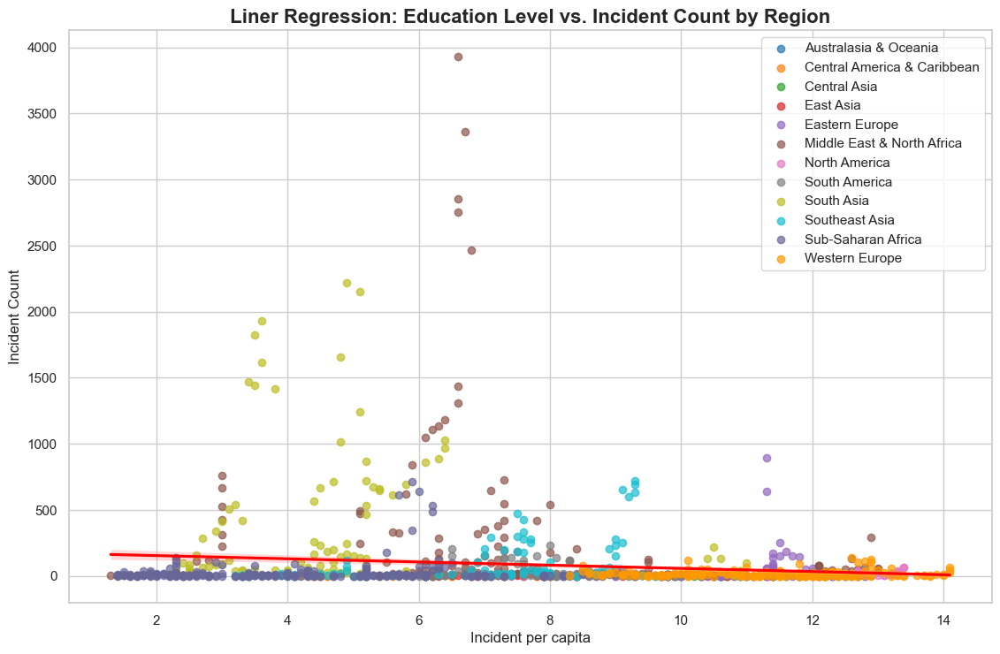

In [73]:
# Linear regression "education_level" and "INCIDENT COUNT"

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
                 '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
                 '#666699', '#ff9900']

selected_data = final_data.groupby('region_txt')

# Plot scatter
plt.figure(figsize=(12, 8))
for i, (region, group) in enumerate(selected_data):
    education_level = group['education_level']
    incident_count = group['incident_count']
    plt.scatter(education_level, incident_count, alpha=0.7, label=region, color=colors[i])
    
sns.regplot(x=final_data['education_level'], y=final_data['incident_count'], scatter=False, color='red')

plt.xlabel('Incident per capita')
plt.ylabel('Incident Count')
plt.title('Liner Regression: Education Level vs. Incident Count by Region', fontsize = 16, fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()

#### Ordinary Least Sqaures (OLS) Regression result

In [74]:
# Define independent & dependent variable
X = final_data[['education_level', 'incident_per_capita']]
y = final_data['incident_count']
# Fit the multiple linear regression model due to having two independent variables
model = sm.OLS(y, X).fit()
# Print the summary
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:         incident_count   R-squared (uncentered):                   0.595
Model:                            OLS   Adj. R-squared (uncentered):              0.594
Method:                 Least Squares   F-statistic:                              910.1
Date:                Fri, 04 Aug 2023   Prob (F-statistic):                   6.62e-244
Time:                        10:26:07   Log-Likelihood:                         -8283.9
No. Observations:                1241   AIC:                                  1.657e+04
Df Residuals:                    1239   BIC:                                  1.658e+04
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------

In [75]:
# Define independent & dependent variable
X = final_data[['education_level', 'population']]
y = final_data['incident_count']
# Fit the multiple linear regression model due to having two independent variables
model = sm.OLS(y, X).fit()
# Print the summary
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:         incident_count   R-squared (uncentered):                   0.070
Model:                            OLS   Adj. R-squared (uncentered):              0.068
Method:                 Least Squares   F-statistic:                              46.33
Date:                Fri, 04 Aug 2023   Prob (F-statistic):                    3.95e-20
Time:                        10:26:07   Log-Likelihood:                         -8800.0
No. Observations:                1241   AIC:                                  1.760e+04
Df Residuals:                    1239   BIC:                                  1.761e+04
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
                      coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

- The F-statistic tests the overall significance of the model. The F-statistic is 531.5, and the associated p-value is close to zero (9.08e-267), indicating that the model is statistically significant.
- The model is statistically significant, but there is a potential multicollinearity issue.
- Overall, the regression analysis shows that the four independent variables have a statistically significant explanatory power in predicting the 'incident_count'

#### Correlation test

Correlation analysis result
- Positive correlation between 'education_level' and 'GDP per capita' (correlation coefficient: 0.693)
- Negative correlation between 'education_level' and 'incident_count' (correlation coefficient: -0.138)
- The correlation between 'GDP per capita' and 'incident_count' is weak (correlation coefficient: -0.119)

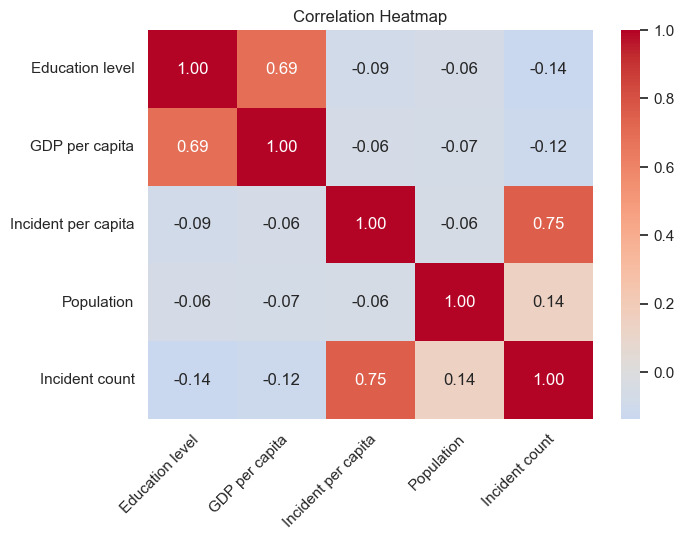

In [76]:
correlation_matrix = final_data[['education_level', 'GDP per capita', 'incident_per_capita', 'population', 'incident_count']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Correlation Heatmap')
labels = ['Education level', 'GDP per capita', 'Incident per capita', 'Population', 'Incident count']
plt.xticks(ticks=[0.6,1.6,2.6,3.6,4.6], labels=labels, rotation=45, ha='right')
plt.yticks(ticks=[0.5,1.5,2.5,3.5,4.5], labels=labels, ha='right')
plt.show()

# Hypothesis testing

* Null Hypothesis (H0): Lack of education in developing countries has no significant relationship with participation in violent extremist activities.
* Alternative Hypothesis (H1): Lack of education in developing countries significantly relates to participation in violent extremist activities.

* Aim: find out whether the model as a whole is statistically significant, and at least one independent variable has a significant impact on the dependent variable.

Linear Regression Analysis (OLS: a common technique for estimating coefficients of linear regression equations)
- The coefficient for the 'education_level' predictor variable is positive (approximately 4.4946) and statistically significant (P-value < 0.001). This indicates that there is a statistically significant correlation between 'education_level' and 'incident_count'.
- The coefficient of 'incident_per_capita' is high, therefore, it may have a potential issue with multicollinearity or outliers in the data.

In [77]:
X = final_data[['education_level', 'GDP per capita', 'incident_per_capita']] 
y = final_data['incident_count'] 

model = sm.OLS(y, X).fit()

print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:         incident_count   R-squared (uncentered):                   0.598
Model:                            OLS   Adj. R-squared (uncentered):              0.597
Method:                 Least Squares   F-statistic:                              614.9
Date:                Fri, 04 Aug 2023   Prob (F-statistic):                   1.25e-244
Time:                        10:26:07   Log-Likelihood:                         -8278.6
No. Observations:                1241   AIC:                                  1.656e+04
Df Residuals:                    1238   BIC:                                  1.658e+04
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------

In [78]:
X = final_data[['education_level', 'GDP per capita']] 
y = final_data['incident_count'] 

model = sm.OLS(y, X).fit()

print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:         incident_count   R-squared (uncentered):                   0.052
Model:                            OLS   Adj. R-squared (uncentered):              0.051
Method:                 Least Squares   F-statistic:                              34.01
Date:                Fri, 04 Aug 2023   Prob (F-statistic):                    4.19e-15
Time:                        10:26:08   Log-Likelihood:                         -8811.5
No. Observations:                1241   AIC:                                  1.763e+04
Df Residuals:                    1239   BIC:                                  1.764e+04
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
                      coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

- After three variable OLS, removed the 'incident_per_capita'.
- While the model is statistically significant, the R-squared value is relatively low, suggesting that the selected features might not fully capture the complexity of the relationship with 'incident_count'.

## From here: Logistic regression model

In [115]:
# Create a binary with mean incident count
final_data['incident_binary'] = (final_data['incident_count'] > 77).astype(int)

logistic_X = final_data[['education_level', 'GDP per capita', 'incident_per_capita', 'population']]
logistic_y = final_data['incident_binary']

# Fit the logistic regression model
logistic_model = sm.Logit(logistic_y, sm.add_constant(logistic_X)).fit()
print(logistic_model.summary())


         Current function value: 1.490890
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:        incident_binary   No. Observations:                 1241
Model:                          Logit   Df Residuals:                     1236
Method:                           MLE   Df Model:                            4
Date:                Fri, 04 Aug 2023   Pseudo R-squ.:                  -2.439
Time:                        19:24:01   Log-Likelihood:                -1850.2
converged:                      False   LL-Null:                       -538.01
Covariance Type:            nonrobust   LLR p-value:                     1.000
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.5015      0.224     -2.235      0.025      -0.941      -0.062
education_level        -0.0639      0.

Logistic regresssion with only education level and incident binary

In [116]:
logi_X = final_data['education_level']
logi_y = final_data['incident_binary']

logi_model = sm.Logit(logi_y, sm.add_constant(logi_X)).fit()
print(logi_model.summary())

Optimization terminated successfully.
         Current function value: 0.420346
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:        incident_binary   No. Observations:                 1241
Model:                          Logit   Df Residuals:                     1239
Method:                           MLE   Df Model:                            1
Date:                Fri, 04 Aug 2023   Pseudo R-squ.:                 0.03040
Time:                        19:24:05   Log-Likelihood:                -521.65
converged:                       True   LL-Null:                       -538.01
Covariance Type:            nonrobust   LLR p-value:                 1.067e-08
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.6763      0.185     -3.650      0.000      -1.039      -0.313
education_leve

Optimization terminated successfully.
         Current function value: 0.588825
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:        incident_binary   No. Observations:                  992
Model:                          Logit   Df Residuals:                      990
Method:                           MLE   Df Model:                            1
Date:                Fri, 04 Aug 2023   Pseudo R-squ.:                 0.01050
Time:                        19:27:43   Log-Likelihood:                -584.11
converged:                       True   LL-Null:                       -590.31
Covariance Type:            nonrobust   LLR p-value:                 0.0004302
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.9495      0.071    -13.284      0.000      -1.090      -0.809
x1            -0.2477      0.

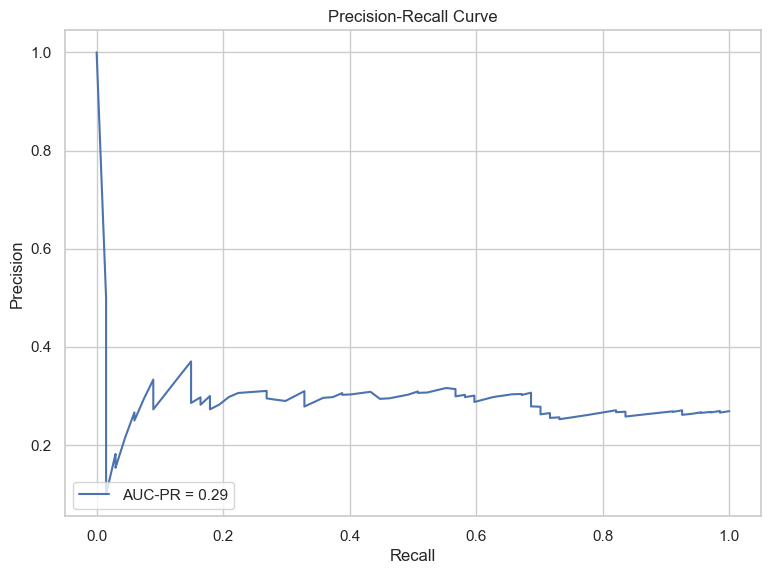

In [126]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve, auc
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Assuming you have the final_data DataFrame

# Create a binary target variable based on a custom threshold (e.g., 23)
final_data['incident_binary'] = (final_data['incident_count'] > 23).astype(int)

# Define predictors and target variable
logi_X = final_data['education_level']
logi_y = final_data['incident_binary']

# Scale the predictor
scaler = StandardScaler()
logi_X_scaled = scaler.fit_transform(logi_X.values.reshape(-1, 1))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(logi_X_scaled, logi_y, test_size=0.2, random_state=42)

# Fit the logistic regression model
logi_model = sm.Logit(y_train, sm.add_constant(X_train)).fit()
print(logi_model.summary())

# Make predictions on the test set
y_pred = logi_model.predict(sm.add_constant(X_test))
y_pred_binary = (y_pred > 0.5).astype(int)

# Evaluate the model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_binary))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_binary))

# Calculate precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, y_pred)

# Calculate AUC-PR
auc_pr = auc(recall, precision)

# Plot Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='b', label=f'AUC-PR = {auc_pr:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.grid(True)
plt.show()


Evaluate model performance

In [129]:
y_pred = logi_model.predict(sm.add_constant(logi_X))
y_pred_binary = np.round(y_pred)

# Calculate evaluation metrics
accuracy = accuracy_score(logi_y, y_pred_binary)
precision = precision_score(logi_y, y_pred_binary)
recall = recall_score(logi_y, y_pred_binary)
f1 = f1_score(logi_y, y_pred_binary)
roc_auc = roc_auc_score(logi_y, y_pred)

# Create a confusion matrix
conf_matrix = confusion_matrix(logi_y, y_pred_binary)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall (Sensitivity):", recall)
print("F1 Score:", f1)
print("Area under ROC curve:", roc_auc)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.7203867848509267
Precision: 0.0
Recall (Sensitivity): 0.0
F1 Score: 0.0
Area under ROC curve: 0.5682955212141139
Confusion Matrix:
[[894   0]
 [347   0]]


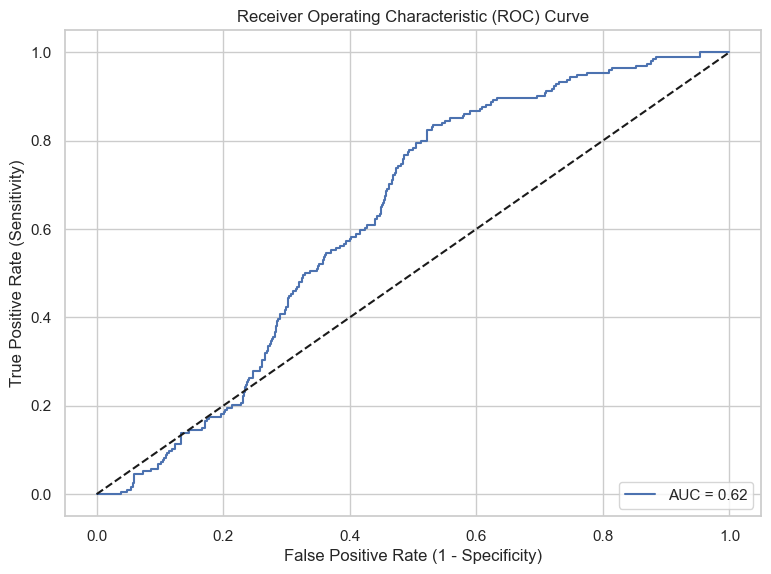

In [111]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

# Calculate the ROC curv and the AUC score after standardized
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X)

# Fit the logistic regression model
logi_model = LogisticRegression()
logi_model.fit(X_standardized, logi_y)

# Predict probabilities for the positive class
y_probs = logi_model.predict_proba(X_standardized)[:, 1]

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(logi_y, y_probs)

# Calculate the AUC score
roc_auc = roc_auc_score(logi_y, y_probs)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], 'k--') 
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


Logistic regression Cross Validation

In [206]:
# Perform cross-validation
num_folds = 5  
cv_scores = cross_val_score(logistic_model, X_standardized, y, cv=num_folds, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean Accuracy:", np.mean(cv_scores))
print("Standard Deviation:", np.std(cv_scores))


InvalidParameterError: The 'estimator' parameter of check_scoring must be an object implementing 'fit'. Got <statsmodels.discrete.discrete_model.BinaryResultsWrapper object at 0x000001B66FC2C6A0> instead.

In [ ]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# Assuming you have 'final_data' DataFrame with relevant columns and the logistic regression model is already trained.

# Step 1: Aggregate the data by country name and calculate the mean (or sum) of the features
aggregated_data = final_data.groupby('country_txt').agg({'education_level': 'mean'}).reset_index()

# Step 2: Prepare the aggregated data for prediction and reshape to a 2D array
X_pred = aggregated_data[['education_level']]
scaler = StandardScaler()
X_pred_standardized = scaler.fit_transform(X_pred)

# Step 3: Use the trained logistic regression model to make predictions
predictions = logi_model.predict_proba(X_pred_standardized)[:, 1]

# Step 4: Add the predictions to the aggregated data
aggregated_data['predicted_probability'] = predictions

# Step 5: Sort the data by the predicted probabilities to identify countries with high chances of terrorism incidents
high_chance_countries = aggregated_data.sort_values(by='predicted_probability', ascending=False)

# Display the top countries with high chances of terrorism incidents
print(high_chance_countries[['country_txt', 'predicted_probability']].head(15))


AttributeError: 'LogitResults' object has no attribute 'predict_proba'

## From here: Linear regression

T-test (sample vs. population)
- It is safe to assume that the sample data and its ability to provide useful insights about the population. 

In [ ]:
final_data

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,education_level,incident_binary
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0,7.110702e-07,2.2,0
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0,3.170964e-07,8.7,0
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0,3.621681e-06,6.1,1
3,2001,Angola,Sub-Saharan Africa,40,2162.4850,16941584.0,2.361054e-06,4.4,0
4,2001,Argentina,South America,2,13651.9810,37480492.0,5.336109e-08,9.1,0
...,...,...,...,...,...,...,...,...,...
1236,2017,Venezuela,South America,17,12879.1350,30563430.0,5.562203e-07,10.3,0
1237,2017,Vietnam,Southeast Asia,2,6422.0864,94033048.0,2.126912e-08,8.2,0
1238,2017,Yemen,Middle East & North Africa,226,2321.9238,30034386.0,7.524709e-06,3.0,1
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,7.0,0


The p-value is greater than 0.05, so it fails to reject the null hypothesis. In other words, there is no enough evidence to conclude that the sample mean is significantly different from the hypothesized population mean.

In [107]:
population = final_data['incident_count']
# Create a sample
sample_size = 500
random_indices = np.random.choice(population.index, size=sample_size, replace=False)
random_sample = population.loc[random_indices]
# Find the mean of the random sample
sample_mean = np.mean(random_sample)
# Find the population mean 
hypothesized_mean = population.mean()
# Perform the one-sample t-test
t_statistic, p_value = ttest_1samp(random_sample, hypothesized_mean)
# Print the results
print("Sample Mean:", sample_mean)
print("Hypothesized Population Mean:", hypothesized_mean)
print("T-Statistic:", t_statistic)
print("P-Value:", p_value)

Sample Mean: 81.814
Hypothesized Population Mean: 82.60515713134569
T-Statistic: -0.07918913486616727
P-Value: 0.9369139325577762


In [ ]:
final_data

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,education_level,incident_binary
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0,7.110702e-07,2.2,0
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0,3.170964e-07,8.7,0
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0,3.621681e-06,6.1,1
3,2001,Angola,Sub-Saharan Africa,40,2162.4850,16941584.0,2.361054e-06,4.4,0
4,2001,Argentina,South America,2,13651.9810,37480492.0,5.336109e-08,9.1,0
...,...,...,...,...,...,...,...,...,...
1236,2017,Venezuela,South America,17,12879.1350,30563430.0,5.562203e-07,10.3,0
1237,2017,Vietnam,Southeast Asia,2,6422.0864,94033048.0,2.126912e-08,8.2,0
1238,2017,Yemen,Middle East & North Africa,226,2321.9238,30034386.0,7.524709e-06,3.0,1
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,7.0,0


In [ ]:
final_data

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,education_level,incident_binary
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0,7.110702e-07,2.2,0
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0,3.170964e-07,8.7,0
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0,3.621681e-06,6.1,1
3,2001,Angola,Sub-Saharan Africa,40,2162.4850,16941584.0,2.361054e-06,4.4,0
4,2001,Argentina,South America,2,13651.9810,37480492.0,5.336109e-08,9.1,0
...,...,...,...,...,...,...,...,...,...
1236,2017,Venezuela,South America,17,12879.1350,30563430.0,5.562203e-07,10.3,0
1237,2017,Vietnam,Southeast Asia,2,6422.0864,94033048.0,2.126912e-08,8.2,0
1238,2017,Yemen,Middle East & North Africa,226,2321.9238,30034386.0,7.524709e-06,3.0,1
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,7.0,0


T-Test between regions

In [ ]:
# Sampling data from population
sub_sahara_education_data = final_data[final_data['region_txt'] == 'Sub-Saharan Africa']['education_level']
mena_education_data = final_data[final_data['region_txt'] == 'Middle East & North Africa']['education_level']
west_europe_education_data= final_data[final_data['region_txt'] == 'Western Europe']['education_level']
south_education_america = final_data[final_data['region_txt'] == 'South America']['education_level']
south_asia_education_data = final_data[final_data['region_txt'] == 'South Asia']['education_level']
southeast_asia_education_data = final_data[final_data['region_txt'] == 'Southeast Asia']['education_level']
eastern_europe_education_data = final_data[final_data['region_txt'] == 'Eastern Europe']['education_level']
central_asia_education_data = final_data[final_data['region_txt'] == 'Central Asia']['education_level']
north_america_education_data = final_data[final_data['region_txt'] == 'North America']['education_level']
caribbean_education_data = final_data[final_data['region_txt'] == 'Central America & Caribbean']['education_level']
oceania_education_data = final_data[final_data['region_txt'] == 'Australasia & Oceania']['education_level']

# Perform the t-test between two regions 
t_statistic, p_value = stats.ttest_ind(south_asia_education_data, sub_sahara_education_data)

# Print the results
print("T-Statistic:", t_statistic)
print("P-Value:", p_value)

T-Statistic: 3.9357276309263742
P-Value: 9.98115444149095e-05


In [ ]:
sample_size = 300

sample_edu_sub_sahara= np.random.choice(sub_sahara_education_data, size=sample_size)
sample_edu_southeast_asia = np.random.choice(southeast_asia_education_data, size=sample_size)
sample_edu_south_asia = np.random.choice(south_asia_education_data, size=sample_size)
sample_edu_central_asia = np.random.choice(central_asia_education_data, size=sample_size)
sample_edu_mena = np.random.choice(mena_education_data, size=sample_size)
sample_edu_eastern_europe = np.random.choice(eastern_europe_education_data, size=sample_size)



t_statistic, p_value = stats.ttest_ind(sample_edu_south_asia, sample_edu_sub_sahara)
print(t_statistic)
print(p_value)

6.65286651676235
6.500482750898068e-11


In [ ]:
t_statistic, p_value = ks_2samp(sample_edu_southeast_asia, sample_edu_eastern_europe)
print(t_statistic)
print(p_value)

0.8866666666666667
5.539698032084739e-124


In [ ]:
sample_edu_southeast_asia

array([ 3.7,  7.7,  7. ,  7.9,  3.5,  7.6,  8.8,  4.1,  8.4,  6.5,  6.3,
        9.4,  9. ,  7. ,  7. ,  3.3,  4.5,  4.1,  9. ,  4.7,  4. ,  7.5,
        9.3,  5.2,  3.3,  5.1,  7.9,  7.3,  4.8,  5.1,  6.8,  7.1,  8.2,
        7.9,  7.6,  3.5,  7.5,  6.9,  7.4,  8.9,  9.4, 10.1,  8.6,  7.9,
        7. ,  4.7,  6.9,  6.7,  9.1,  4.5,  3.3,  9. ,  8. ,  7.1,  3.4,
        9.3,  8. ,  7.6,  9.3,  7.9,  6.5,  7.6,  8.2,  7. ,  5.2,  8.9,
        9.1,  3.9,  8. ,  8.4,  9.2,  5. ,  7.1,  5.6,  7.3,  5.6, 10.2,
        5.1,  9.1,  7.9,  8.4,  7.4,  8. ,  5.1,  7.1,  3.3,  8. ,  3.4,
        7. , 10.2,  8.6,  9.3,  3.9,  7.4,  3.7,  7.4,  4.5,  9. ,  7.3,
       10.1,  7.5,  7.9,  7.5,  7.9,  7.9,  3.2,  3.8,  8.6,  7.6,  3.3,
        8.9,  7.3,  8.2, 10.1,  5.2,  7.1,  4.7,  7.7,  4.9,  9.3,  7.7,
        7.7,  7.6,  7.6,  4.1,  4.1,  3.2,  8. ,  7.3,  7.6,  7.5,  4. ,
        3.9,  7. ,  7.7,  3.3,  3.9,  6.8,  9.1,  3.4,  9. ,  4.9,  4. ,
        7.5, 10.1,  7.1,  3.3,  3.4,  7.7,  6.8,  9

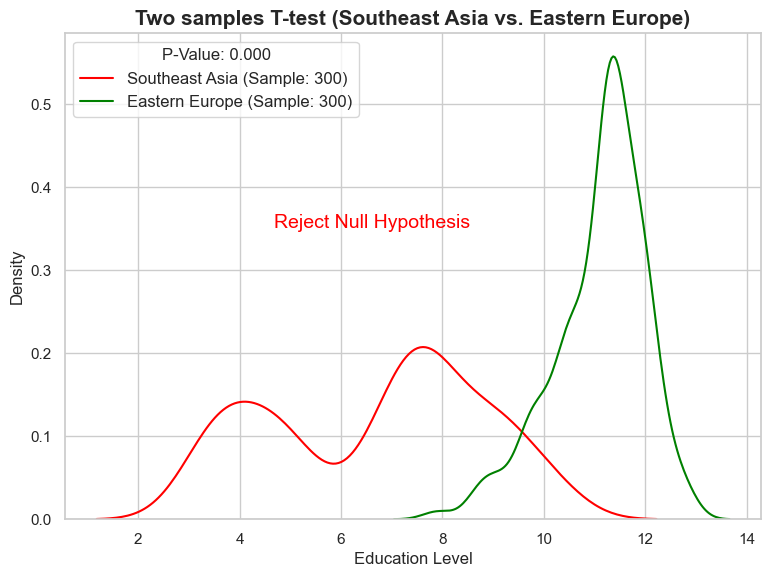

In [ ]:
# Country vs country sample t-test
plt.figure(figsize=(8, 6))

# Plot the KDE plots for the two samples
sns.kdeplot(sample_edu_southeast_asia, color='red', label='Southeast Asia (Sample: 300)')
sns.kdeplot(sample_edu_eastern_europe, color='green', label='Eastern Europe (Sample: 300)')

plt.xlabel('Education Level')
plt.ylabel('Density')
plt.title('Two samples T-test (Southeast Asia vs. Eastern Europe)', fontsize = 15, fontweight='bold')

t_statistic, p_value = stats.ttest_ind(sample_edu_southeast_asia, sample_edu_eastern_europe)


# Add the t-statistic as a vertical dashed line on the plot
#plt.axvline(t_statistic, color='blue', linestyle='dashed', linewidth=2, label=f'T-Statistic: {t_statistic:.3f}')
#plt.axvline(sample_edu_southeast_asia.mean())

# Add a legend with the p-value
plt.legend(title=f"P-Value: {p_value:.3f}", loc='upper left', fontsize=12)

# Compare the p-value with the significance level 
alpha = 0.05
if p_value < alpha:
    # Reject the null hypothesis
    plt.annotate('Reject Null Hypothesis', xy=(0.3, 0.6), xycoords='axes fraction', fontsize=14, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('Fail to Reject Null Hypothesis', xy=(0.3, 0.6), xycoords='axes fraction', fontsize=14, color='green')

plt.show()

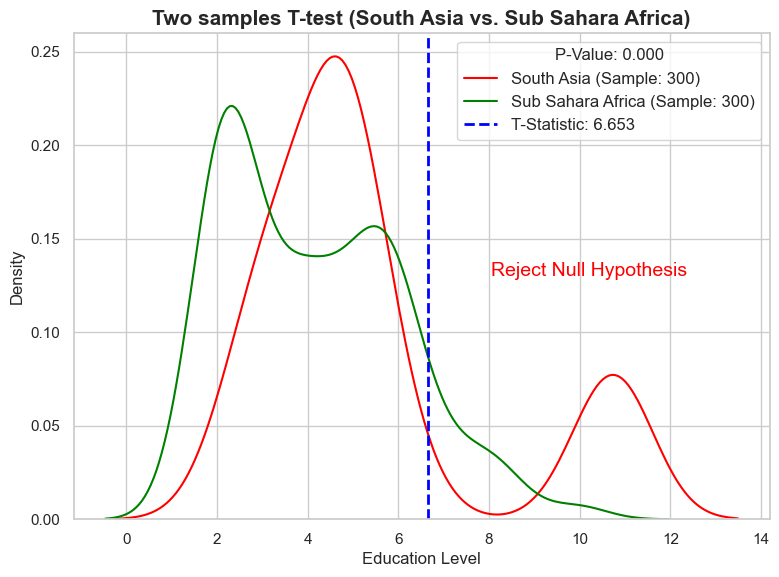

In [ ]:
# Country vs country sample t-test
plt.figure(figsize=(8, 6))

# Plot the KDE plots for the two samples
sns.kdeplot(sample_edu_south_asia, color='red', label='South Asia (Sample: 300)')
sns.kdeplot(sample_edu_sub_sahara, color='green', label='Sub Sahara Africa (Sample: 300)')

plt.xlabel('Education Level')
plt.ylabel('Density')
plt.title('Two samples T-test (South Asia vs. Sub Sahara Africa)', fontsize = 15, fontweight='bold')

t_statistic, p_value = stats.ttest_ind(sample_edu_south_asia, sample_edu_sub_sahara, equal_var=True)


# Add the t-statistic as a vertical dashed line on the plot
plt.axvline(t_statistic, color='blue', linestyle='dashed', linewidth=2, label=f'T-Statistic: {t_statistic:.3f}')
#plt.axvline(sample_edu_south_asia.mean(), color='red')
#plt.axvline(sample_edu_sub_sahara.mean(), color='green')
# Add a legend with the p-value
plt.legend(title=f"P-Value: {p_value:.3f}", loc='upper right', fontsize=12)

# Compare the p-value with the significance level 
alpha = 0.05
if p_value < alpha:
    # Reject the null hypothesis
    plt.annotate('Reject Null Hypothesis', xy=(0.6, 0.5), xycoords='axes fraction', fontsize=14, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('Fail to Reject Null Hypothesis', xy=(0.6, 0.5), xycoords='axes fraction', fontsize=14, color='green')

plt.show()

In [ ]:
# Sampling data from population
sub_sahara_data = final_data[final_data['region_txt'] == 'Sub-Saharan Africa']['incident_count']
mena_data = final_data[final_data['region_txt'] == 'Middle East & North Africa']['incident_count']
west_europe_data= final_data[final_data['region_txt'] == 'Western Europe']['incident_count']
south_america = final_data[final_data['region_txt'] == 'South America']['incident_count']
south_asia_data = final_data[final_data['region_txt'] == 'South Asia']['incident_count']
southeast_asia_data = final_data[final_data['region_txt'] == 'Southeast Asia']['incident_count']
eastern_europe_data = final_data[final_data['region_txt'] == 'Eastern Europe']['incident_count']
central_asia_data = final_data[final_data['region_txt'] == 'Central Asia']['incident_count']
north_america_data = final_data[final_data['region_txt'] == 'North America']['incident_count']
caribbean_data = final_data[final_data['region_txt'] == 'Central America & Caribbean']['incident_count']
oceania_data = final_data[final_data['region_txt'] == 'Australasia & Oceania']['incident_count']

# Perform the t-test between two regions 
t_statistic, p_value = stats.ttest_ind(mena_data, sub_sahara_data)

# Print the results
print("T-Statistic:", t_statistic)
print("P-Value:", p_value)

T-Statistic: 4.83353696528518
P-Value: 1.8229323414998041e-06


### Use the Ridge Regression

The regularization term with alpha=0.1 helps prevent overfitting and improves the model's ability to generalize to unseen data.

Grayed area is representing the rejection region for the null hypothesis.

All four features have a slightly better results

#### With all variables but no standardization

In [ ]:
X2 = final_data[['GDP per capita', 'education_level', 'incident_per_capita', 'population']]
y2 = final_data['incident_count']

X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.5, random_state=42)

model = LinearRegression()
model.fit(X_train2, y_train2)

y_pred2 = model.predict(X_test2)

mse2 = mean_squared_error(y_test2, y_pred2)
r2_2 = r2_score(y_test2, y_pred2)

print("Mean Squared Error:", mse2)
print("R-squared:", r2_2)

Mean Squared Error: 46940.18457443252
R-squared: 0.3722036037860653


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train2_scaled = scaler.fit_transform(X_train2)
X_test2_scaled = scaler.transform(X_test2)

# Train the model on the standardized training set
model = LinearRegression()
model.fit(X_train2_scaled, y_train2)

# Predict using the standardized testing set
y_pred2_scaled = model.predict(X_test2_scaled)

mse2 = mean_squared_error(y_test2, y_pred2_scaled)
r2_2 = r2_score(y_test2, y_pred2_scaled)

print("Mean Squared Error:", mse2)
print("R-squared:", r2_2)


Mean Squared Error: 46940.18457591532
R-squared: 0.37220360376623374


In [ ]:
X2 = final_data[['education_level']]
y2 = final_data['incident_count']

X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.5, random_state=42)

model = LinearRegression()
model.fit(X_train2, y_train2)

y_pred2 = model.predict(X_test2)

mse2 = mean_squared_error(y_test2, y_pred2)
r2_2 = r2_score(y_test2, y_pred2)

print("Mean Squared Error:", mse2)
print("R-squared:", r2_2)

Mean Squared Error: 73359.62294051771
R-squared: 0.01885969713984903


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train2_scaled = scaler.fit_transform(X_train2)
X_test2_scaled = scaler.transform(X_test2)

# Train the model on the standardized training set
model = LinearRegression()
model.fit(X_train2_scaled, y_train2)

# Predict using the standardized testing set
y_pred2_scaled = model.predict(X_test2_scaled)

mse2 = mean_squared_error(y_test2, y_pred2_scaled)
r2_2 = r2_score(y_test2, y_pred2_scaled)

print("Mean Squared Error:", mse2)
print("R-squared:", r2_2)

Mean Squared Error: 73359.62294051771
R-squared: 0.01885969713984903


A standardized linear regression model has a better outcome

#### Heatmap by educaiton level

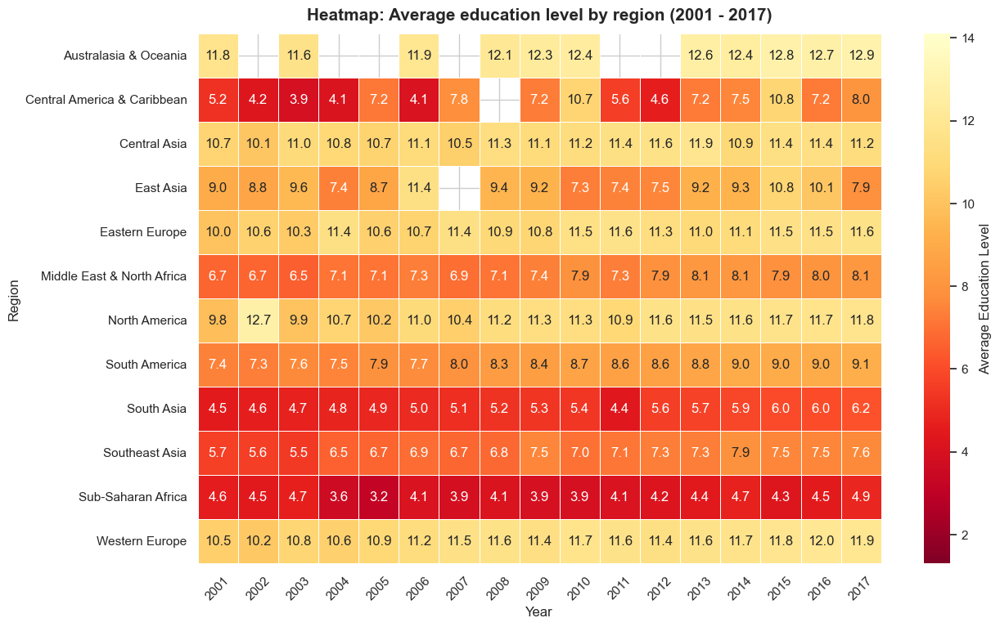

In [ ]:
heatmap_data = final_data.pivot_table(index='region_txt', columns='year', values='education_level', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd_r', annot=True, fmt='.1f', linewidths=0.5, cbar_kws={'label': 'Average Education Level'}, vmin=final_data['education_level'].min(), vmax=final_data['education_level'].max())
plt.xlabel('Year')
plt.ylabel('Region')
plt.xticks(rotation=45, ha='center')
plt.title('Heatmap: Average education level by region (2001 - 2017)', pad=12, fontsize=15, fontweight='bold')
plt.show()


Why do T-Test? 
The t-test, also known as t-statistic or sometimes t-distribution, is a popular statistical tool used to test differences between the means (averages) of two groups, or the difference between one group’s mean and a standard value. Running a t-test helps you to understand whether the differences are statistically significant (i.e. they didn’t just happen by a fluke).

Change it to 'education_level'

In [ ]:
t_stat, p_value = ttest_ind(sample_edu_mena, sample_edu_south_asia, equal_var=False)
print(t_stat)
print(p_value)

11.680169375832547
2.0608343996921023e-28


In [ ]:
t_stat, p_value = ttest_ind(sample_mena, sample_south_asia, equal_var=False)

# Display the t-test results
print("T-Statistic:", t_stat)
print("P-Value:", p_value)

T-Statistic: -4.396036146920664
P-Value: 1.306442582789799e-05


In [ ]:
lower = stats.t.ppf(q=0.025, df=199)
upper = stats.t.ppf(q=0.975, df=199)
print("Lower quantile is ", lower)
print("Upper quantile is ", upper)

Lower quantile is  -1.9719565442493954
Upper quantile is  1.971956544249395


Two tail test

In [ ]:
stats.t.cdf(x= -4.260089577664159, df=199) * 2

3.150719223722895e-05

Confidence interval

In [ ]:
mena_mean = sample_mena.mean()
mena_mean

185.05333333333334

In [ ]:
sample_south_asia.mean()

370.5466666666667

In [ ]:
import math
sigma = sample_south_asia.std()/math.sqrt(200)
stats.t.interval(0.95, df=199, loc=sample_south_asia.mean(), scale=sigma)

(295.4653116958577, 445.6280216374757)

Overall, this analysis suggests that the incident counts differ significantly between South Asia and MENA

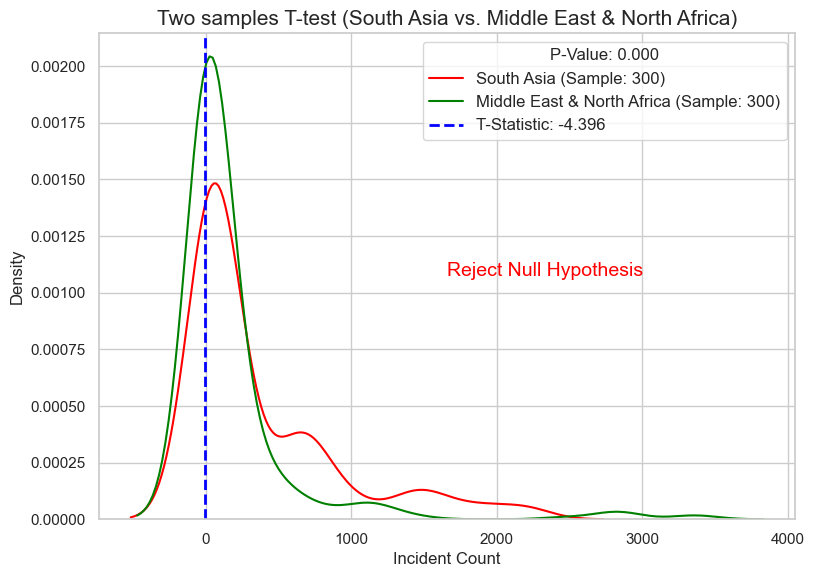

In [ ]:
# Country vs country sample t-test
plt.figure(figsize=(8, 6))

# Plot the KDE plots for the two samples
sns.kdeplot(sample_south_asia, color='red', label='South Asia (Sample: 300)')
sns.kdeplot(sample_mena, color='green', label='Middle East & North Africa (Sample: 300)')

plt.xlabel('Incident Count')
plt.ylabel('Density')
plt.title('Two samples T-test (South Asia vs. Middle East & North Africa)', fontsize = 15)

# Add the t-statistic as a vertical dashed line on the plot
plt.axvline(t_stat, color='blue', linestyle='dashed', linewidth=2, label=f'T-Statistic: {t_stat:.3f}')

# Add a legend with the p-value
plt.legend(title=f"P-Value: {p_value:.3f}", loc='upper right', fontsize=12)

# Compare the p-value with the significance level (commonly chosen as 0.05)
alpha = 0.05
if p_value < alpha:
    # Reject the null hypothesis
    plt.annotate('Reject Null Hypothesis', xy=(0.5, 0.5), xycoords='axes fraction', fontsize=14, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('Fail to Reject Null Hypothesis', xy=(0.5, 0.5), xycoords='axes fraction', fontsize=14, color='green')

plt.show()



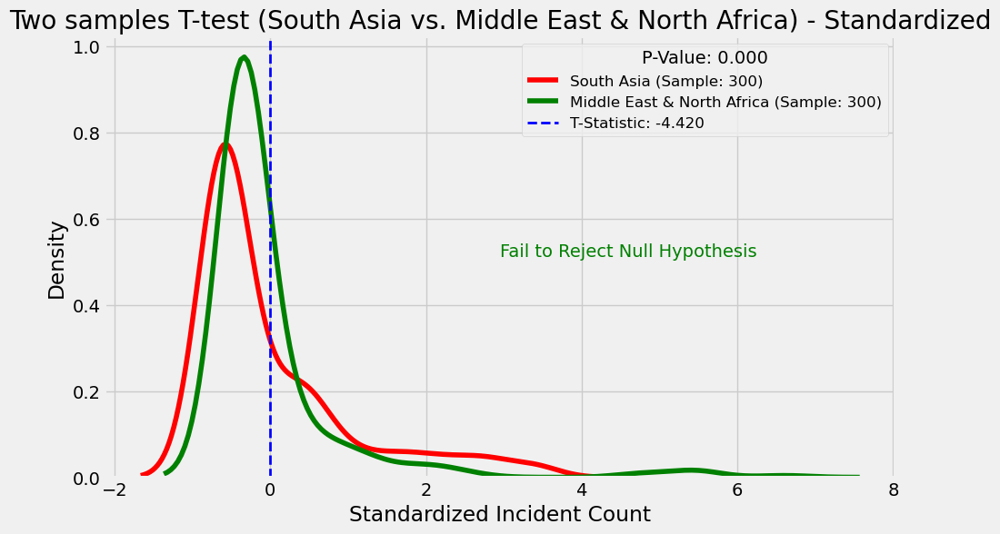

In [ ]:
# Standardize the data for South Asia and MENA
sample_south_asia_standardized = (sample_south_asia - np.mean(sample_south_asia)) / np.std(sample_south_asia)
sample_mena_standardized = (sample_mena - np.mean(sample_mena)) / np.std(sample_mena)

scaler = StandardScaler() # vectorize it

# Perform the t-test on the standardized data
t_stat2, p_value2 = ttest_ind(sample_south_asia_standardized, sample_mena_standardized, equal_var=False)

# Plot the KDEs for the two standardized samples
plt.figure(figsize=(10, 6))
sns.kdeplot(sample_south_asia_standardized, color='red', label='South Asia (Sample: 300)')
sns.kdeplot(sample_mena_standardized, color='green', label='Middle East & North Africa (Sample: 300)')

# Add a vertical line for t-statistic
plt.axvline(t_stat2, color='blue', linestyle='dashed', linewidth=2, label=f'T-Statistic: {t_stat:.3f}')

alpha = 0.05
if p_value2 < alpha:
    # Reject the null hypothesis
    plt.annotate('Reject Null Hypothesis', xy=(0.5, 0.5), xycoords='axes fraction', fontsize=14, color='red')
else:
    # Fail to reject the null hypothesis
    plt.annotate('Fail to Reject Null Hypothesis', xy=(0.5, 0.5), xycoords='axes fraction', fontsize=14, color='green')

# Add p-value inside the legend
plt.legend(title=f"P-Value: {p_value:.3f}", loc='upper right', fontsize=12)

plt.xlabel('Standardized Incident Count')
plt.ylabel('Density')
plt.title('Two samples T-test (South Asia vs. Middle East & North Africa) - Standardized')
plt.show()


Standardizing the data can also amplify the effect of outliers, especially if the original data had extreme values. 

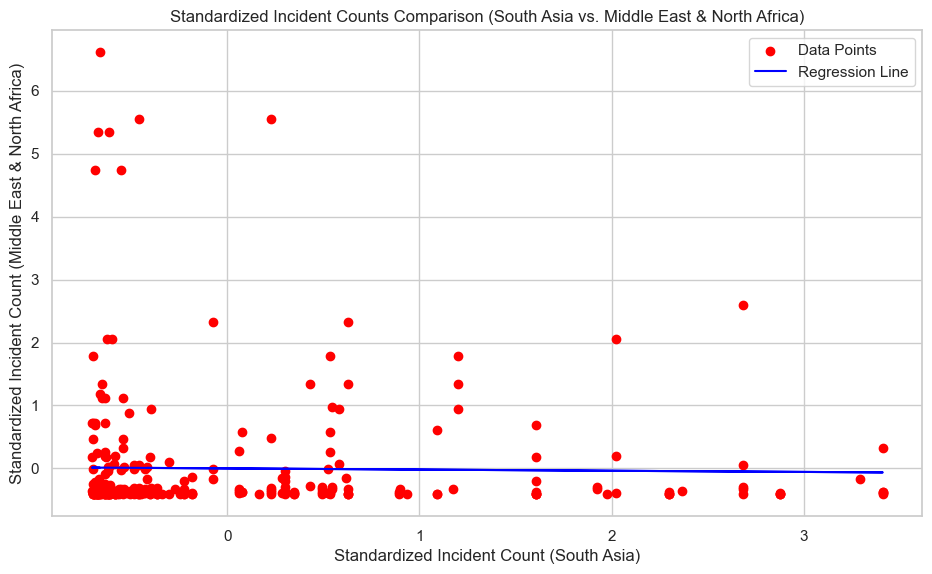

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

# Choose the minimum number of samples between South Asia and MENA
num_samples = 300
#min(len(sample_south_asia), len(sample_mena))

# Create a StandardScaler object
scaler = StandardScaler()

# Standardize the data for South Asia and MENA with the chosen number of samples
sample_south_asia_standardized = scaler.fit_transform(sample_south_asia[:num_samples].reshape(-1, 1))
sample_mena_standardized = scaler.fit_transform(sample_mena[:num_samples].reshape(-1, 1))

# Fit the standardized data into a Linear Regression model
model = LinearRegression()
model.fit(sample_south_asia_standardized, sample_mena_standardized)

# Get the coefficients and intercept of the regression line
coef = model.coef_[0][0]
intercept = model.intercept_[0]

# Plot the standardized data points and the regression line
plt.figure(figsize=(10, 6))
plt.scatter(sample_south_asia_standardized, sample_mena_standardized, color='red', label='Data Points')
plt.plot(sample_south_asia_standardized, coef * sample_south_asia_standardized + intercept, color='blue', label='Regression Line')
plt.xlabel('Standardized Incident Count (South Asia)')
plt.ylabel('Standardized Incident Count (Middle East & North Africa)')
plt.title('Standardized Incident Counts Comparison (South Asia vs. Middle East & North Africa)')
plt.legend()
plt.show()


Two-Tail test

In [ ]:
education_level = final_data['education_level']
incident_count = final_data['incident_count']
gdp_per_capita = final_data['GDP per capita']
incident_per_capita = final_data['incident_per_capita']
population = final_data['population']

# Pearson correlation test
correlation_coef_edu_incident, p_value_edu_incident = pearsonr(education_level, incident_count)

correlation_coef_gdp_incident, p_value_gdp_incident = pearsonr(gdp_per_capita, incident_count)

alpha = 0.05

if p_value_edu_incident < alpha:
    print("Reject the null hypothesis. There is a significant correlation between education level and the number of terrorist incidents.")
else:
    print("Fail to reject the null hypothesis. There is no significant correlation between education level and the number of terrorist incidents.")

if p_value_gdp_incident < alpha:
    print("Reject the null hypothesis. There is a significant correlation between GDP per capita and the number of terrorist incidents.")
else:
    print("Fail to reject the null hypothesis. There is no significant correlation between GDP per capita and the number of terrorist incidents.")


Reject the null hypothesis. There is a significant correlation between education level and the number of terrorist incidents.
Reject the null hypothesis. There is a significant correlation between GDP per capita and the number of terrorist incidents.


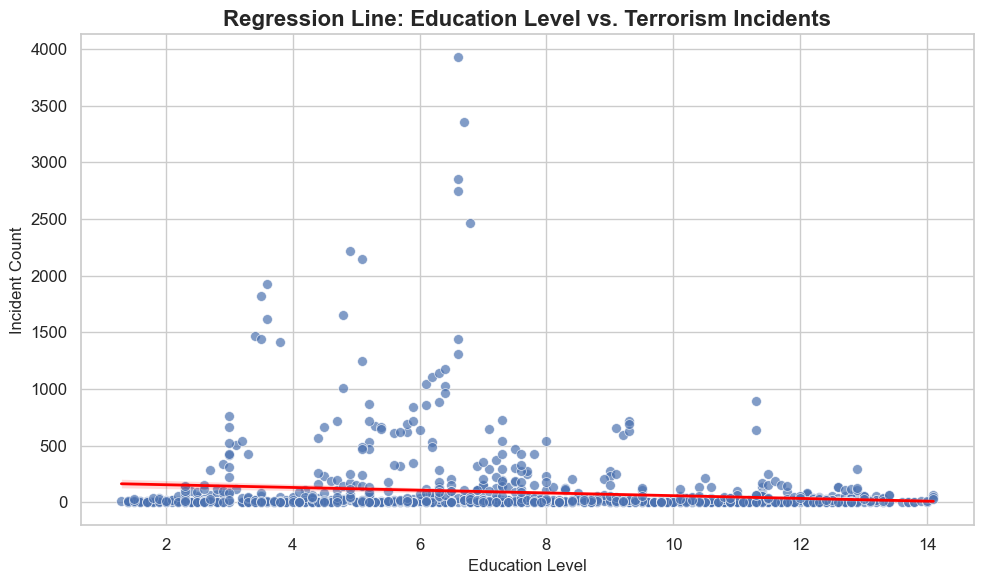

In [ ]:
plt.figure(figsize=(10, 6))
sns.set(style='whitegrid')
sns.scatterplot(x=education_level, y=incident_count, data=final_data, palette='viridis', alpha=0.7, s=50)

sns.regplot(x=education_level, y=incident_count, scatter=False, line_kws={'color': 'red', 'linestyle': '-', 'linewidth': 2})

plt.xlabel('Education Level')
plt.ylabel('Incident Count')
plt.title('Regression Line: Education Level vs. Terrorism Incidents', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


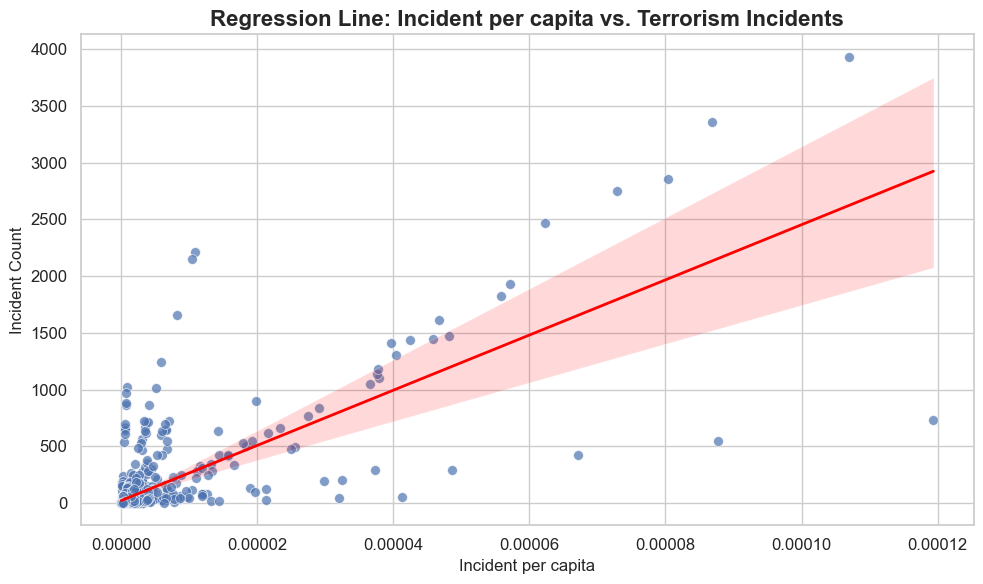

In [ ]:
plt.figure(figsize=(10, 6))
sns.set(style='whitegrid')
sns.scatterplot(x=incident_per_capita, y=incident_count, data=final_data, palette='viridis', alpha=0.7, s=50)

sns.regplot(x=incident_per_capita, y=incident_count, scatter=False, line_kws={'color': 'red', 'linestyle': '-', 'linewidth': 2})

plt.xlabel('Incident per capita')
plt.ylabel('Incident Count')
plt.title('Regression Line: Incident per capita vs. Terrorism Incidents', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

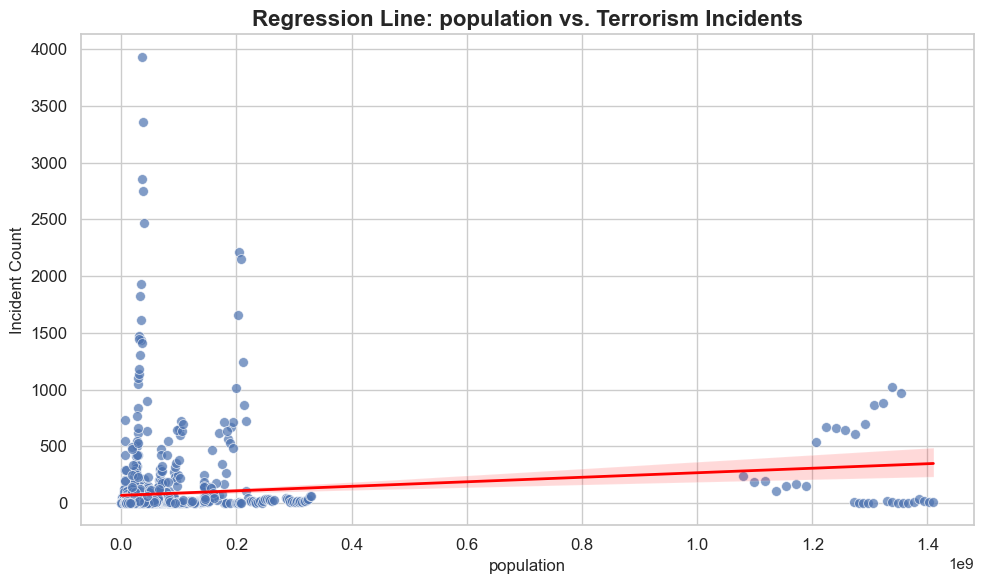

In [ ]:
plt.figure(figsize=(10, 6))
sns.set(style='whitegrid')
sns.scatterplot(x=population, y=incident_count, data=final_data, palette='viridis', alpha=0.7, s=50)

sns.regplot(x=population, y=incident_count, scatter=False, line_kws={'color': 'red', 'linestyle': '-', 'linewidth': 2})

plt.xlabel('population')
plt.ylabel('Incident Count')
plt.title('Regression Line: population vs. Terrorism Incidents', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

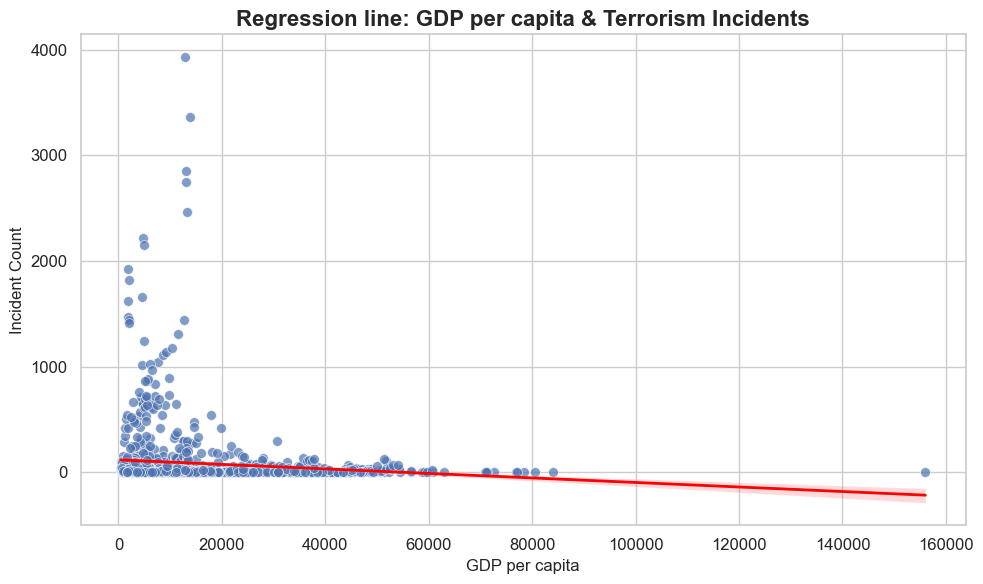

In [ ]:
plt.figure(figsize=(10, 6))
sns.set(style='whitegrid')
sns.scatterplot(x=gdp_per_capita, y=incident_count, data=final_data, palette='viridis', alpha=0.7, s=50)

sns.regplot(x=gdp_per_capita, y=incident_count, scatter=False, line_kws={'color': 'red', 'linestyle': '-', 'linewidth': 2})

plt.xlabel('GDP per capita')
plt.ylabel('Incident Count')
plt.title('Regression line: GDP per capita & Terrorism Incidents', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


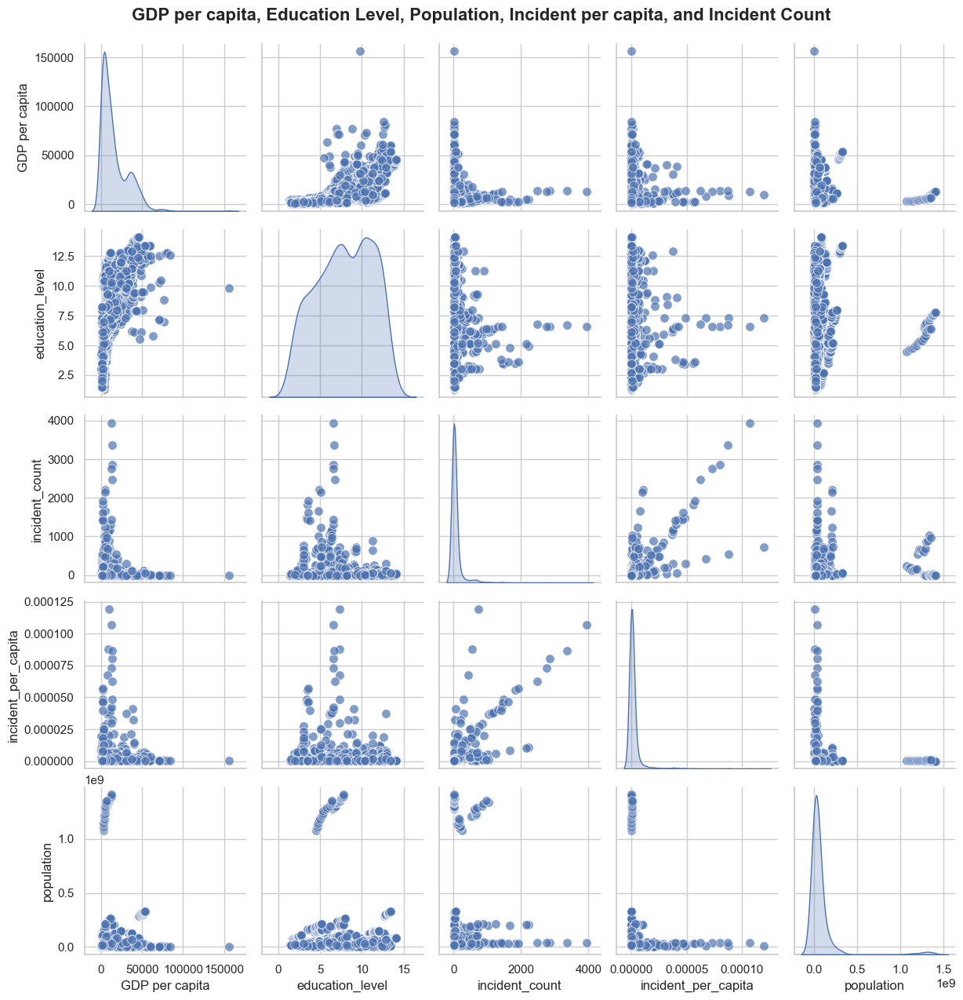

In [ ]:
variables = ['GDP per capita', 'education_level', 'incident_count', 'incident_per_capita', 'population']
sns.set(style='whitegrid')

sns.pairplot(final_data[variables], diag_kind='kde', plot_kws={'alpha': 0.7, 's': 70})
plt.suptitle('GDP per capita, Education Level, Population, Incident per capita, and Incident Count', fontsize=16, fontweight='bold', y=1.02)
plt.show()


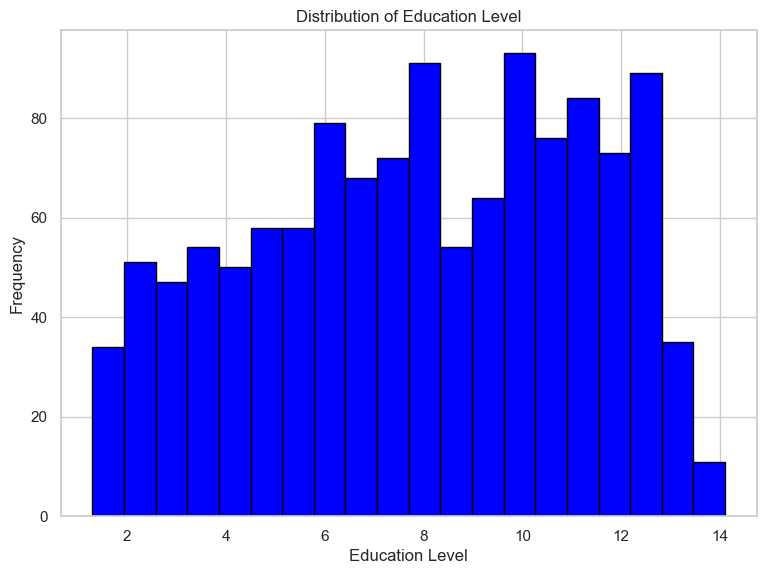

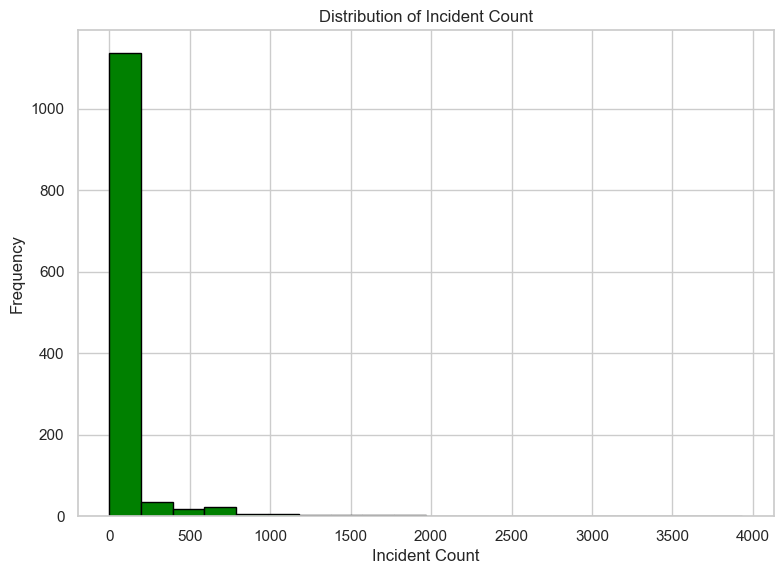

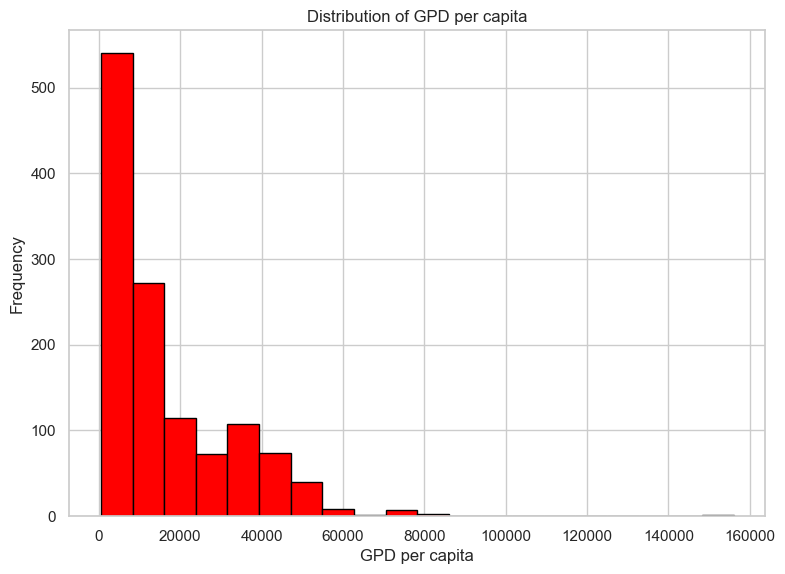

In [ ]:
education_level_cleaned = final_data['education_level']
incident_count_cleaned = final_data['incident_count']
gdp_cleaned = final_data['GDP per capita']

plt.figure(figsize=(8, 6))
plt.hist(education_level_cleaned, bins=20, color='blue', edgecolor='black')
plt.xlabel('Education Level')
plt.ylabel('Frequency')
plt.title('Distribution of Education Level')
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(incident_count_cleaned, bins=20, color='green', edgecolor='black')
plt.xlabel('Incident Count')
plt.ylabel('Frequency')
plt.title('Distribution of Incident Count')
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(gdp_cleaned, bins=20, color='red', edgecolor='black')
plt.xlabel('GPD per capita')
plt.ylabel('Frequency')
plt.title('Distribution of GPD per capita')
plt.grid(True)
plt.show()


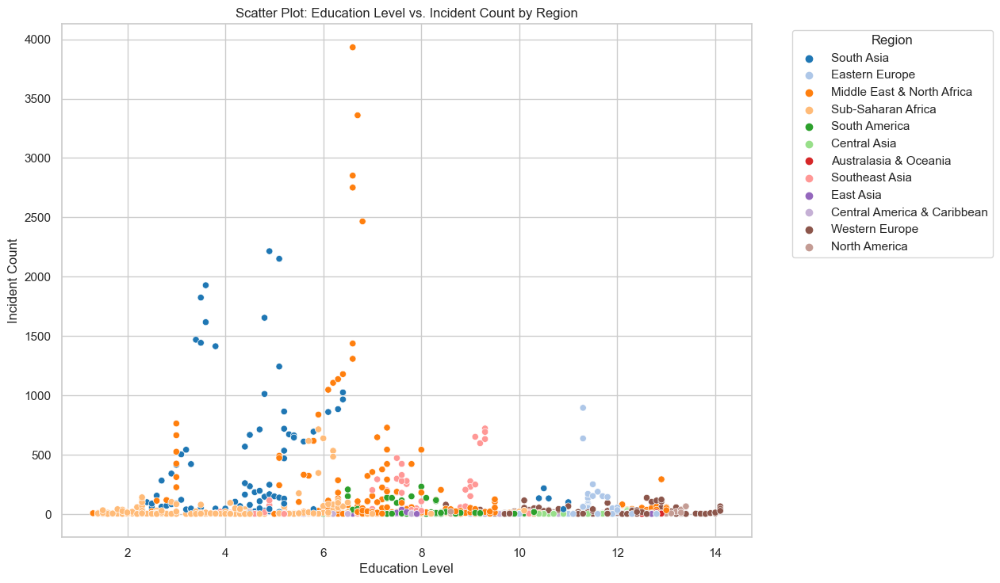

In [ ]:
education_level_cleaned = final_data['education_level']
incident_count_cleaned = final_data['incident_count']
region_txt = final_data['region_txt']

plt.figure(figsize=(10, 8))
sns.scatterplot(x=education_level, y=incident_count_cleaned, hue=region_txt, palette='tab20')
plt.xlabel('Education Level')
plt.ylabel('Incident Count')
plt.title('Scatter Plot: Education Level vs. Incident Count by Region')
plt.grid(True)
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


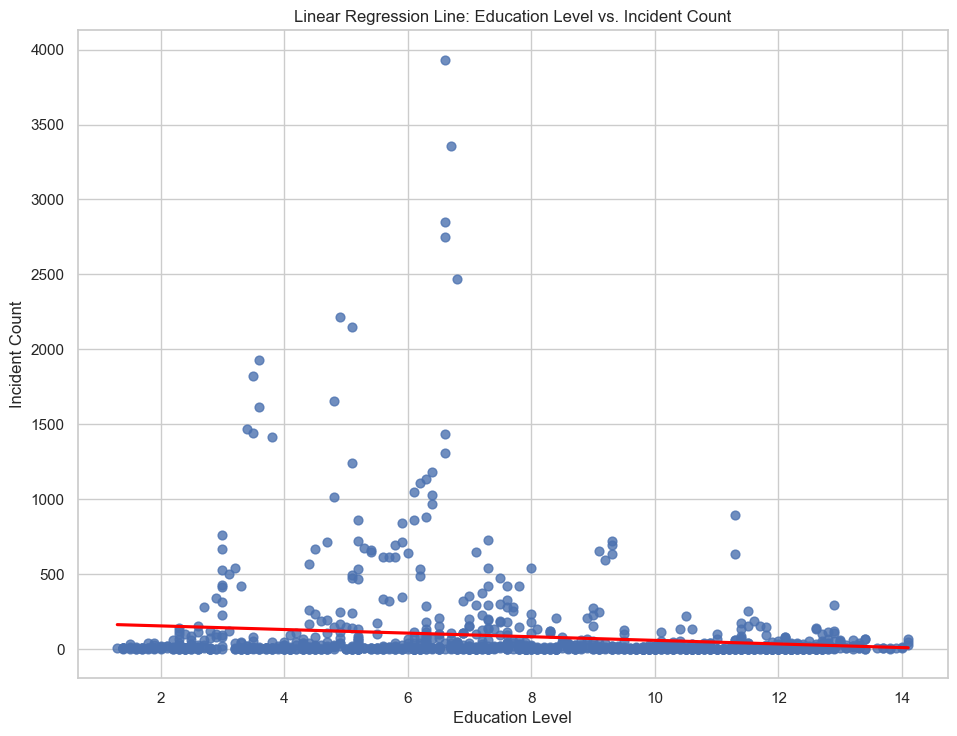

In [ ]:
plt.figure(figsize=(10, 8))
sns.regplot(x=education_level, y=incident_count, scatter_kws={'s': 40}, line_kws={'color': 'red'}, ci=None)
plt.xlabel('Education Level')
plt.ylabel('Incident Count')
plt.title('Linear Regression Line: Education Level vs. Incident Count')
plt.grid(True)
plt.show()


QQ plot

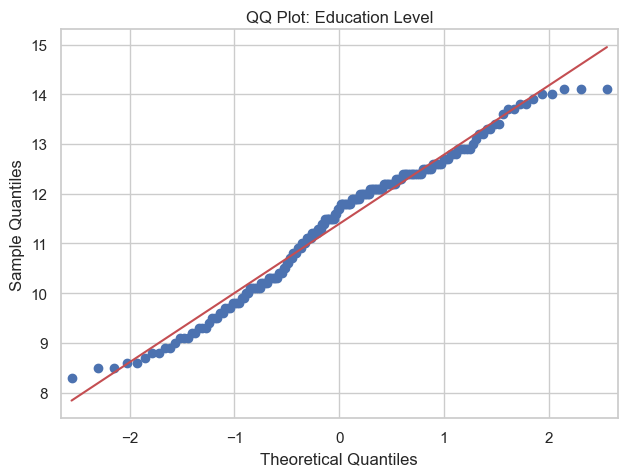

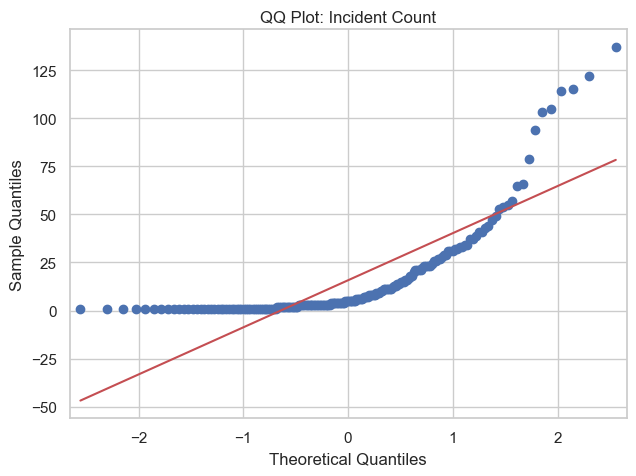

NameError: name 'gdp_per_capita' is not defined

In [108]:
sm.qqplot(education_level, line='s')
plt.title('QQ Plot: Education Level')
plt.show()

sm.qqplot(incident_count, line='s')
plt.title('QQ Plot: Incident Count')
plt.show()

sm.qqplot(gdp_per_capita, line='s')
plt.title('QQ Plot: GDP per capita')
plt.show()

sm.qqplot(population, line='s')
plt.title('QQ Plot: Population')
plt.show()

sm.qqplot(incident_per_capita, line='s')
plt.title('QQ Plot: Incident per capita')
plt.show()

Randomly selected incident count to see the t-test result

In [132]:
from scipy.stats import ttest_ind, mannwhitneyu

high_incident_group = final_data[final_data['incident_count'] > 40]
low_incident_group = final_data[final_data['incident_count'] <= 40]

t_stat, p_value_ttest = ttest_ind(high_incident_group['education_level'], low_incident_group['education_level'])

alpha = 0.05  
if p_value_ttest < alpha:
    print("Reject the null hypothesis. There is a significant difference in the average education level between countries with high and low numbers of terrorist incidents (t-test).")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in the average education level between countries with high and low numbers of terrorist incidents (t-test).")


Reject the null hypothesis. There is a significant difference in the average education level between countries with high and low numbers of terrorist incidents (t-test).


Calculate the sum of incident count, average GDP per capita, and average education level by country name and region

In [133]:
new_final = final_data.groupby(['country_txt', 'region_txt']).agg({
    'incident_count': 'sum',
    'GDP per capita': 'mean',
    'education_level': 'mean'
}).reset_index()

new_final['constant'] = 1

new_final


,country_txt,region_txt,incident_count,GDP per capita,education_level,constant
0,Afghanistan,South Asia,12593,1437.658194,3.035294,1
1,Albania,Eastern Europe,13,8836.755750,9.512500,1
2,Algeria,Middle East & North Africa,1212,11560.511588,7.176471,1
3,Angola,Sub-Saharan Africa,57,5982.143733,4.733333,1
4,Argentina,South America,24,17885.798167,9.616667,1
...,...,...,...,...,...,...
132,Venezuela,South America,56,16560.460417,8.741667,1
133,Vietnam,Southeast Asia,6,4668.886200,6.900000,1
134,Yemen,Middle East & North Africa,3230,4023.590600,2.418750,1
135,Zambia,Sub-Saharan Africa,3,2538.302300,6.550000,1


In [134]:
iraq_final = new_final[new_final['country_txt'] == 'Iraq']

In [ ]:
iraq_final

,country_txt,region_txt,incident_count,GDP per capita,education_level,constant,predicted_incident_count
57,Iraq,Middle East & North Africa,24465,9302.029635,6.176471,1,1015.125494


In [135]:
X = new_final[['GDP per capita', 'education_level', 'constant']]
y = new_final['incident_count']

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Get the predicted incident count from the model
new_final['predicted_incident_count'] = model.predict(X)

# Group the data by 'region_txt' and find the country with the highest predicted incident count in each region
highest_incidents_by_region = new_final.groupby('region_txt').apply(lambda group: group.loc[group['predicted_incident_count'].idxmax()])

# Print the result
result_regression = highest_incidents_by_region[['region_txt', 'country_txt', 'predicted_incident_count']]
result_regression


,region_txt,country_txt,predicted_incident_count
region_txt,,,
Australasia & Oceania,Australasia & Oceania,New Zealand,180.418355
Central America & Caribbean,Central America & Caribbean,Guatemala,1290.011879
Central Asia,Central Asia,Turkmenistan,669.611034
East Asia,East Asia,China,895.039584
Eastern Europe,Eastern Europe,Albania,628.161630
Middle East & North Africa,Middle East & North Africa,Yemen,1493.805818
North America,North America,Mexico,756.546284
South America,South America,Bolivia,895.920806
South Asia,South Asia,Afghanistan,1440.730371


In [136]:
new_final

,country_txt,region_txt,incident_count,GDP per capita,education_level,constant,predicted_incident_count
0,Afghanistan,South Asia,12593,1437.658194,3.035294,1,1440.730371
1,Albania,Eastern Europe,13,8836.755750,9.512500,1,628.161630
2,Algeria,Middle East & North Africa,1212,11560.511588,7.176471,1,881.441701
3,Angola,Sub-Saharan Africa,57,5982.143733,4.733333,1,1208.496471
4,Argentina,South America,24,17885.798167,9.616667,1,549.221484
...,...,...,...,...,...,...,...
132,Venezuela,South America,56,16560.460417,8.741667,1,661.393936
133,Vietnam,Southeast Asia,6,4668.886200,6.900000,1,964.631408
134,Yemen,Middle East & North Africa,3230,4023.590600,2.418750,1,1493.805818
135,Zambia,Sub-Saharan Africa,3,2538.302300,6.550000,1,1021.306077


In [138]:
X2 = new_final[['education_level', 'constant']]
y2 = new_final['incident_count']

# Fit the linear regression model
model = sm.OLS(y2, X2).fit()

# Get the predicted incident count from the model
new_final['predicted_incident_count'] = model.predict(X2)

# Group the data by 'region_txt' and find the country with the highest predicted incident count in each region
highest_incidents_by_region2 = new_final.groupby('region_txt').apply(lambda group: group.loc[group['predicted_incident_count'].idxmax()])

# Print the result
result_regression2 = highest_incidents_by_region2[['region_txt', 'country_txt', 'predicted_incident_count']]
result_regression2

,region_txt,country_txt,predicted_incident_count
region_txt,,,
Australasia & Oceania,Australasia & Oceania,New Zealand,190.974442
Central America & Caribbean,Central America & Caribbean,Guatemala,1311.492800
Central Asia,Central Asia,Turkmenistan,627.454087
East Asia,East Asia,China,859.419975
Eastern Europe,Eastern Europe,Albania,534.271663
Middle East & North Africa,Middle East & North Africa,Yemen,1537.470287
North America,North America,Mexico,741.982391
South America,South America,Brazil,893.832192
South Asia,South Asia,Afghanistan,1450.278575


In [139]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

# Assuming you have already defined X2 and y2

# Initialize the Linear Regression model
model = LinearRegression()

# Perform cross-validation with 5 folds
scores = cross_val_score(model, X2, y2, cv=5)

# Print the cross-validation scores
print("Cross-Validation Scores:", scores)
print("Mean Cross-Validation Score:", np.mean(scores))


Cross-Validation Scores: [ 0.06112943 -0.02834272  0.00411769  0.01850165  0.0695328 ]
Mean Cross-Validation Score: 0.02498777016232896


In [141]:
new_final

,country_txt,region_txt,incident_count,GDP per capita,education_level,constant,predicted_incident_count
0,Afghanistan,South Asia,12593,1437.658194,3.035294,1,1450.278575
1,Albania,Eastern Europe,13,8836.755750,9.512500,1,534.271663
2,Algeria,Middle East & North Africa,1212,11560.511588,7.176471,1,864.633107
3,Angola,Sub-Saharan Africa,57,5982.143733,4.733333,1,1210.141749
4,Argentina,South America,24,17885.798167,9.616667,1,519.540406
...,...,...,...,...,...,...,...
132,Venezuela,South America,56,16560.460417,8.741667,1,643.282967
133,Vietnam,Southeast Asia,6,4668.886200,6.900000,1,903.731597
134,Yemen,Middle East & North Africa,3230,4023.590600,2.418750,1,1537.470287
135,Zambia,Sub-Saharan Africa,3,2538.302300,6.550000,1,953.228622


In [142]:
X3 = new_final[['education_level', 'GDP per capita', 'constant']]
y3 = new_final['incident_count']

# Fit the linear regression model
model = sm.OLS(y3, X3).fit()

# Get the predicted incident count from the model
new_final['predicted_incident_count'] = model.predict(X3)

# Group the data by 'region_txt' and find the country with the highest predicted incident count in each region
highest_incidents_by_region2 = new_final.groupby('region_txt').apply(lambda group: group.loc[group['predicted_incident_count'].idxmax()])

# Print the result
result_regression3 = highest_incidents_by_region2[['region_txt', 'country_txt', 'predicted_incident_count']]
result_regression3

,region_txt,country_txt,predicted_incident_count
region_txt,,,
Australasia & Oceania,Australasia & Oceania,New Zealand,180.418355
Central America & Caribbean,Central America & Caribbean,Guatemala,1290.011879
Central Asia,Central Asia,Turkmenistan,669.611034
East Asia,East Asia,China,895.039584
Eastern Europe,Eastern Europe,Albania,628.161630
Middle East & North Africa,Middle East & North Africa,Yemen,1493.805818
North America,North America,Mexico,756.546284
South America,South America,Bolivia,895.920806
South Asia,South Asia,Afghanistan,1440.730371


In [143]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

# Assuming you have already defined X2 and y2

# Initialize the Linear Regression model
model = LinearRegression()

# Perform cross-validation with 5 folds
scores = cross_val_score(model, X3, y3, cv=5)

# Print the cross-validation scores
print("Cross-Validation Scores:", scores)
print("Mean Cross-Validation Score:", np.mean(scores))

Cross-Validation Scores: [ 0.05689327 -0.02164502  0.00435887  0.0224142   0.04467181]
Mean Cross-Validation Score: 0.02133862652123488


In [164]:
median_incident

5.0

In [163]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

# Assuming you already have the final_data DataFrame

# Create a binary target variable based on median incident count
median_incident = final_data['incident_count'].median()
final_data['incident_binary'] = (final_data['incident_count'] > median_incident).astype(int)

# Define predictors and target variable
X = final_data[['education_level', 'GDP per capita']]
y = final_data['incident_count']

# Scale the predictors
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Create and fit the Ridge regression model
ridge_model = Ridge(alpha=0.01)  # You can adjust the regularization strength (alpha) as needed
ridge_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = ridge_model.predict(X_test)

# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Perform cross-validation to evaluate the model
cv_scores = cross_val_score(ridge_model, X_scaled, y, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean Cross-Validation Score:", np.mean(cv_scores))


Mean Squared Error: 74214.91754364489
Cross-Validation Scores: [-6.01584890e+00 -1.68125329e-01  2.96137191e-02 -1.37487449e-02
 -3.45173203e-03]
Mean Cross-Validation Score: -1.2343121965639738


In [166]:
mean_incident = final_data['incident_count'].mean()
mean_incident

82.60515713134569

In [187]:
final_data

,year,country_txt,region_txt,incident_count,GDP per capita,population,incident_per_capita,education_level,incident_binary
0,2001,Afghanistan,South Asia,14,489.6820,19688634.0,7.110702e-07,2.2,0
1,2001,Albania,Eastern Europe,1,5285.8090,3153615.0,3.170964e-07,8.7,0
2,2001,Algeria,Middle East & North Africa,113,7218.2456,31200984.0,3.621681e-06,6.1,0
3,2001,Angola,Sub-Saharan Africa,40,2162.4850,16941584.0,2.361054e-06,4.4,0
4,2001,Argentina,South America,2,13651.9810,37480492.0,5.336109e-08,9.1,0
...,...,...,...,...,...,...,...,...,...
1236,2017,Venezuela,South America,17,12879.1350,30563430.0,5.562203e-07,10.3,0
1237,2017,Vietnam,Southeast Asia,2,6422.0864,94033048.0,2.126912e-08,8.2,0
1238,2017,Yemen,Middle East & North Africa,226,2321.9238,30034386.0,7.524709e-06,3.0,0
1239,2017,Zambia,Sub-Saharan Africa,2,3497.5818,17298056.0,1.156199e-07,7.0,0


Cross-validation with Lasso or Ridge

In [199]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

# Assuming you already have the final_data DataFrame

# Create a binary target variable based on median incident count
median_incident = final_data['incident_count'].median()
final_data['incident_binary'] = (final_data['incident_count'] > mean_incident).astype(int)

# Define predictors and target variable
X = final_data[['education_level', 'GDP per capita', 'population']]
y = final_data['incident_binary']

# Scale the predictors
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Create and fit the Lasso regression model
ridge_model = Ridge(alpha=1)  # You can adjust the regularization strength (alpha) as needed
ridge_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = ridge_model.predict(X_test)

# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Perform cross-validation to evaluate the model
cv_scores = cross_val_score(lasso_model, X_scaled, y, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean Cross-Validation Score:", np.mean(cv_scores))


Mean Squared Error: 0.10003094992327756
Cross-Validation Scores: [-0.14638686 -0.00700979 -0.00273537 -0.03598183 -0.02804013]
Mean Cross-Validation Score: -0.04403079496375373


In [200]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix

# Assuming you already have the final_data DataFrame

# Define predictors and target variable
X = final_data[['education_level', 'GDP per capita']]
y = final_data['incident_binary']

# Scale the predictors
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Create and fit the SVM model
svm_model = SVC(kernel='linear')  # You can try different kernels ('linear', 'rbf', 'poly', etc.)
svm_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = svm_model.predict(X_test)

# Calculate accuracy on the test set
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Perform cross-validation to evaluate the model
cv_scores = cross_val_score(svm_model, X_scaled, y, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean Cross-Validation Score:", np.mean(cv_scores))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.8835341365461847
Cross-Validation Scores: [0.84738956 0.85080645 0.85080645 0.84677419 0.84677419]
Mean Cross-Validation Score: 0.8485101697111025
Confusion Matrix:
[[220   0]
 [ 29   0]]


In [201]:
final_data['incident_binary']

0       0
1       0
2       1
3       0
4       0
       ..
1236    0
1237    0
1238    1
1239    0
1240    0
Name: incident_binary, Length: 1241, dtype: int32

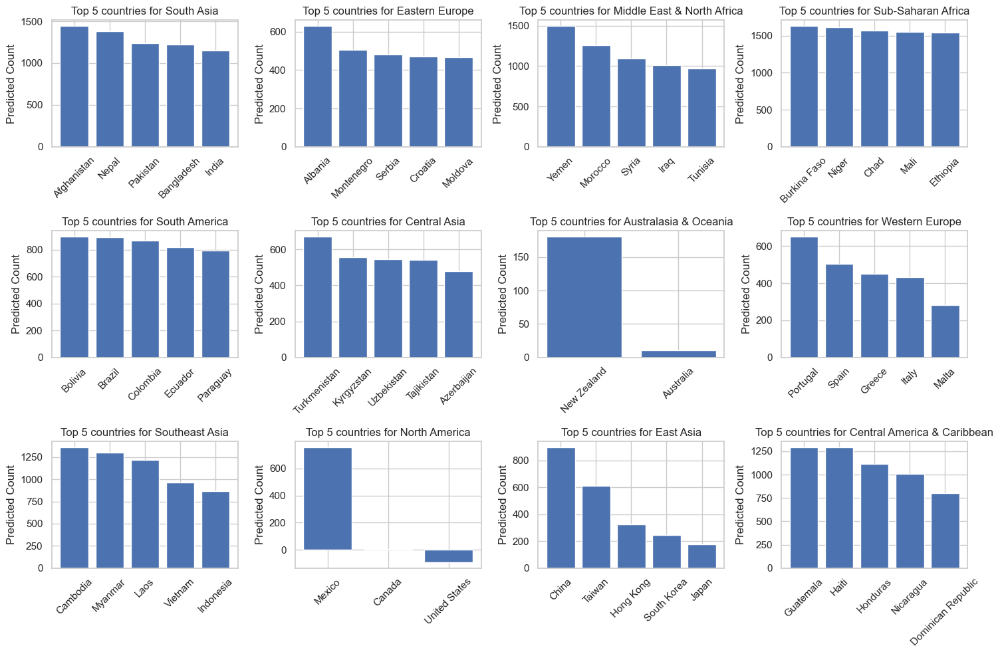

In [202]:
import matplotlib.pyplot as plt

# Sort by regions
unique_regions = new_final['region_txt'].unique()

plt.figure(figsize=(15, 10))

# Create bar charts with for loop
for i, region in enumerate(unique_regions, start=1):
    plt.subplot(3, 4, i)
    region_data = new_final[new_final['region_txt'] == region]
    
    # Sort the data
    region_data_sorted = region_data.sort_values(by='predicted_incident_count', ascending=False)
    
    # Limit top 5 countries within regions
    top_countries = region_data_sorted.head(5)
    countries = top_countries['country_txt']
    predicted_incident_counts = top_countries['predicted_incident_count']
    
    # Create the bar chart
    plt.bar(range(len(top_countries)), predicted_incident_counts)
    
    # Set the xticks with country names
    plt.xticks(range(len(top_countries)), countries, rotation=45)
    
    # Set the plot title and labels
    plt.title(f'Top 5 countries for {region}')
    plt.ylabel('Predicted Count')

plt.tight_layout()
plt.show()

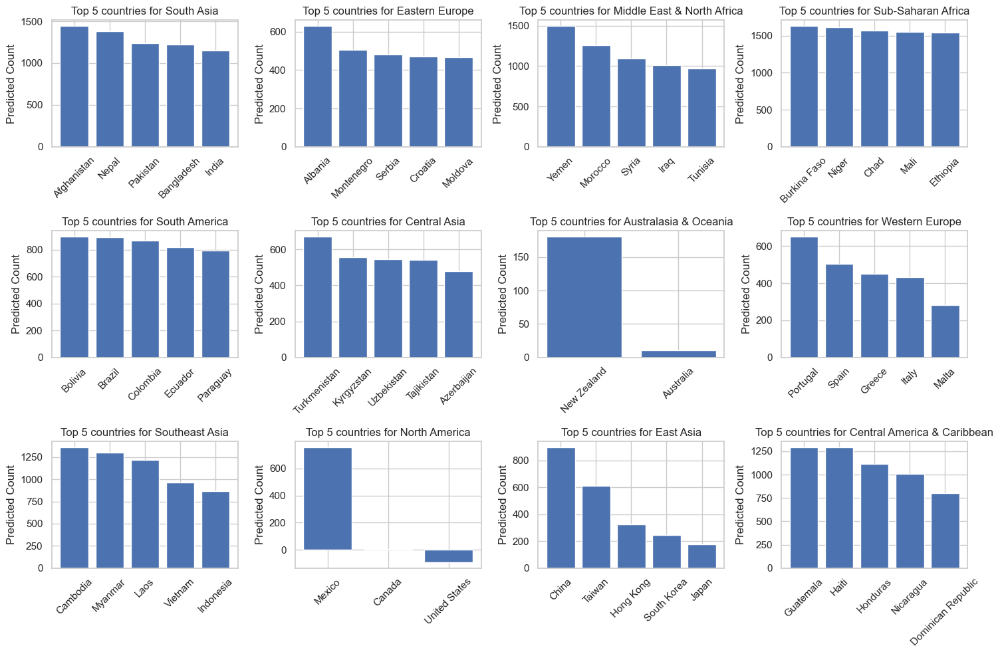

In [203]:
import matplotlib.pyplot as plt

# Sort by regions
unique_regions2 = new_final['region_txt'].unique()

plt.figure(figsize=(15, 10))

# Create bar charts with for loop
for i, region in enumerate(unique_regions2, start=1):
    plt.subplot(3, 4, i)
    region_data2 = new_final[new_final['region_txt'] == region]
    
    # Sort the data
    region_data_sorted2 = region_data2.sort_values(by='predicted_incident_count', ascending=False)
    
    # Limit top 5 countries within regions
    top_countries2 = region_data_sorted2.head(5)
    countries2 = top_countries2['country_txt']
    predicted_incident_counts2 = top_countries2['predicted_incident_count']
    
    # Create the bar chart
    plt.bar(range(len(top_countries2)), predicted_incident_counts2)
    
    # Set the xticks with country names
    plt.xticks(range(len(top_countries2)), countries2, rotation=45)
    
    # Set the plot title and labels
    plt.title(f'Top 5 countries for {region}')
    plt.ylabel('Predicted Count')

plt.tight_layout()
plt.show()

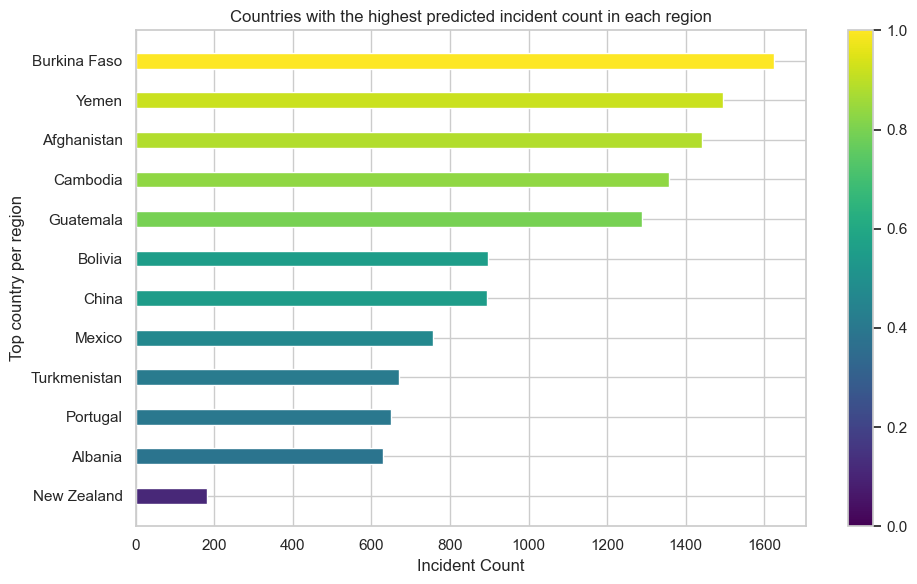

In [204]:
plt.figure(figsize=(10, 6))
bar_width = 0.4

highest_incidents_by_region_sorted = highest_incidents_by_region.sort_values(by='predicted_incident_count', ascending=True)

index = np.arange(len(highest_incidents_by_region_sorted))

# Set color map with viridis
color_map = 'viridis'

# Create the bar chart with gradation
bars = plt.barh(index, highest_incidents_by_region_sorted['predicted_incident_count'], 
                height=bar_width, color=plt.cm.get_cmap(color_map)(highest_incidents_by_region_sorted['predicted_incident_count'] 
                                                                   / highest_incidents_by_region_sorted['predicted_incident_count'].max()))

# Add a color bar
cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(cmap=color_map))

plt.xlabel('Incident Count')
plt.ylabel('Top country per region')
plt.title('Countries with the highest predicted incident count in each region')
plt.yticks(index, highest_incidents_by_region_sorted['country_txt'])
plt.tight_layout()
plt.show()


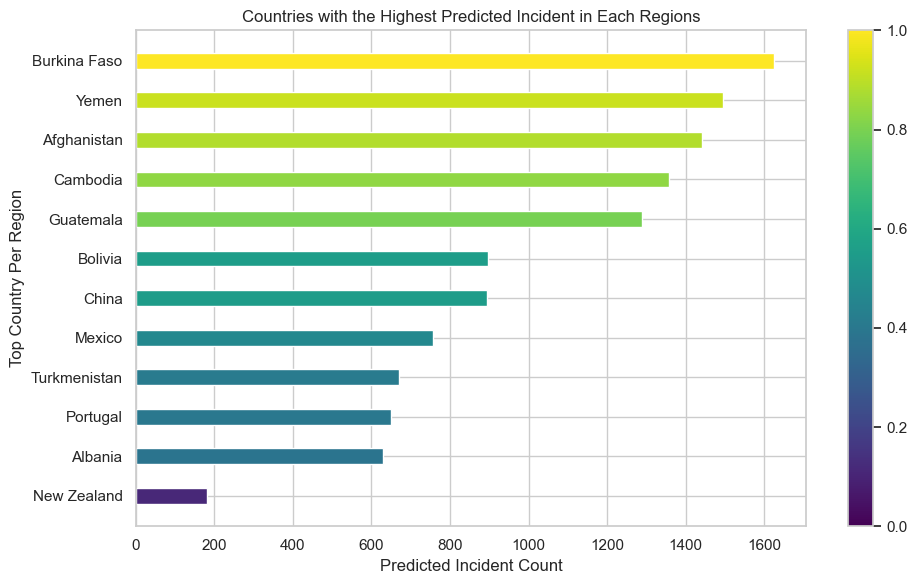

In [205]:
plt.figure(figsize=(10, 6))
bar_width = 0.4

highest_incidents_by_region2_sorted = highest_incidents_by_region2.sort_values(by='predicted_incident_count', ascending=True)

index2 = np.arange(len(highest_incidents_by_region2_sorted))

# Set color map with viridis
color_map = 'viridis'

# Create the bar chart with gradation
bars2 = plt.barh(index2, highest_incidents_by_region2_sorted['predicted_incident_count'], 
                height=bar_width, color=plt.cm.get_cmap(color_map)(highest_incidents_by_region2_sorted['predicted_incident_count'] 
                                                                   / highest_incidents_by_region2_sorted['predicted_incident_count'].max()))

# Add a color bar
cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(cmap=color_map))

plt.xlabel('Predicted Incident Count')
plt.ylabel('Top Country Per Region')
plt.title('Countries with the Highest Predicted Incident in Each Regions')
plt.yticks(index2, highest_incidents_by_region2_sorted['country_txt'])
plt.tight_layout()
plt.show()


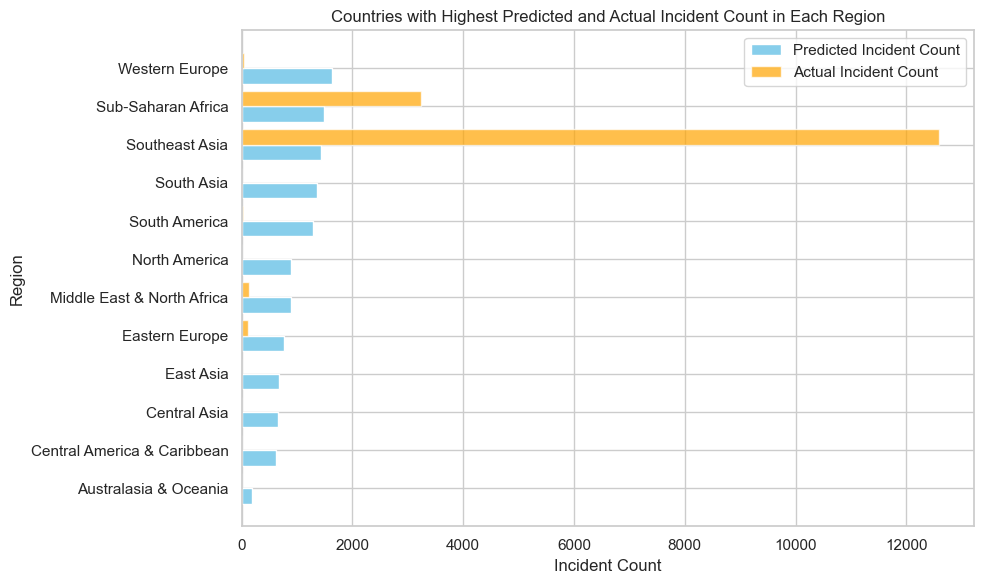

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Plot the countries with the highest predicted incident count for each region
plt.figure(figsize=(10, 6))
bar_width = 0.4

incidents_region_sorted = highest_incidents_by_region.sort_values(by='predicted_incident_count', ascending=True)

index = np.arange(len(incidents_region_sorted))

plt.barh(index, incidents_region_sorted['predicted_incident_count'], color='skyblue', label='Predicted Incident Count', height=bar_width)
plt.barh(index + bar_width, incidents_region_sorted['incident_count'], color='orange', alpha=0.7, label='Actual Incident Count', height=bar_width)

plt.xlabel('Incident Count')
plt.ylabel('Region')
plt.title('Countries with Highest Predicted and Actual Incident Count in Each Region')
plt.yticks(index + bar_width / 2, highest_incidents_by_region['region_txt'])
plt.legend()
plt.tight_layout()
plt.show()


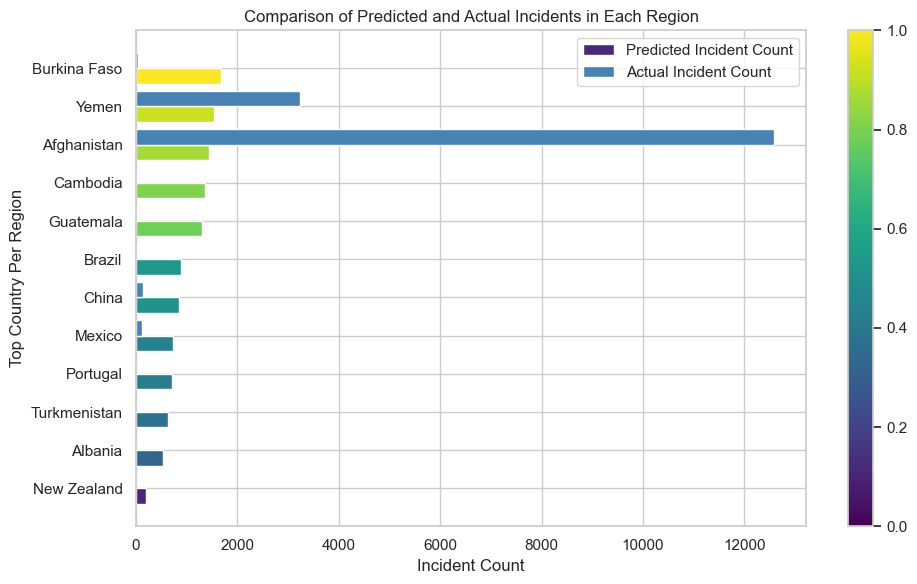

In [ ]:
plt.figure(figsize=(10, 6))
bar_width = 0.4

highest_incidents_by_region2_sorted = highest_incidents_by_region2.sort_values(by='predicted_incident_count', ascending=True)

index2 = np.arange(len(highest_incidents_by_region2_sorted))

# Set color map with viridis
color_map = 'viridis'

# Create the bar chart with gradation for predicted incident count
bars2 = plt.barh(index2, highest_incidents_by_region2_sorted['predicted_incident_count'], 
                height=bar_width, color=plt.cm.get_cmap(color_map)(highest_incidents_by_region2_sorted['predicted_incident_count'] 
                                                                   / highest_incidents_by_region2_sorted['predicted_incident_count'].max()), label='Predicted Incident Count')

# Create the bar chart for actual incident count
bars_actual = plt.barh(index2 + bar_width, highest_incidents_by_region2_sorted['incident_count'], 
                       height=bar_width, color='steelblue', label='Actual Incident Count')

# Add a color bar
cbar = plt.colorbar(mappable=plt.cm.ScalarMappable(cmap=color_map))

plt.xlabel('Incident Count')
plt.ylabel('Top Country Per Region')
plt.title('Comparison of Predicted and Actual Incidents in Each Region')
plt.yticks(index2 + bar_width / 2, highest_incidents_by_region2_sorted['country_txt'])
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()
